In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
import torchvision.models as models

import numpy as np
import copy
import cv2

In [2]:
"""

brick_wall.jpg
lacelike.jpg
pebbles.jpg
radish.jpg
red-peppers.jpg

"""

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
imsize = 256
nc = 3

loader = transforms.Compose([
    transforms.Resize(imsize),  # scale imported image
    transforms.ToTensor()])  # transform it into a torch tensor

def cv_converter(img):
    image = Image.fromarray(img[...,::-1])
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)    
 
    
def image_loader(image_name):
    image = Image.open(image_name)
    # fake batch dimension required to fit network's input dimensions
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)


def gram_matrix(input):
    a, b, c, d = input.size()  # a=batch size(=1)
    # b=number of feature maps
    # (c,d)=dimensions of a f. map (N=c*d)

    features = input.view(a * b, c * d)  # resise F_XL into \hat F_XL

    G = torch.mm(features, features.t())  # compute the gram product

    # we 'normalize' the values of the gram matrix
    # by dividing by the number of element in each feature maps.
    return G.div(a * b * c * d)


class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        # .view the mean and std to make them [C x 1 x 1] so that they can
        # directly work with image Tensor of shape [B x C x H x W].
        # B is batch size. C is number of channels. H is height and W is width.
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, img):
        # normalize img
        return (img - self.mean) / self.std

    
# class ContentLoss(nn.Module):

#     def __init__(self, target,):
#         super(ContentLoss, self).__init__()
#         # we 'detach' the target content from the tree used
#         # to dynamically compute the gradient: this is a stated value,
#         # not a variable. Otherwise the forward method of the criterion
#         # will throw an error.
#         self.target = target.detach()

#     def forward(self, input):
#         self.loss = F.mse_loss(input, self.target)
#         return input


class StyleLoss(nn.Module):

    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input




In [165]:
ref_img = image_loader("./data/texture/pebbles.jpg")

cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)
cnn = models.vgg19(pretrained=True).features.to(device).eval()

unloader = transforms.ToPILImage()  # reconvert into PIL image

def imshow(tensor, title=None):
    tensor = torch.clamp(tensor,0,1)
    image = tensor.cpu().clone()  # we clone the tensor to not do changes on it
    image = image.squeeze(0)      # remove the fake batch dimension
    image = unloader(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.savefig('pebbles_noise_1.jpg',dpi = 300)
    plt.show()

    
def imshow1(tensor, title=None):
    tensor = torch.clamp(tensor,0,1)
    image = tensor.cpu().clone()  # we clone the tensor to not do changes on it
    image = image.squeeze(0)      # remove the fake batch dimension
    image = unloader(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.savefig('pebbles_noise_3.jpg',dpi = 300)
    plt.show()
# plt.figure()
# imshow(ref_img, title='reference texture')

In [4]:
"""


texture network



"""

#content_layers_default = ['conv_4']
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                               style_img, 
                               #content_img,
                               #content_layers=content_layers_default,
                               style_layers=style_layers_default):
    cnn = copy.deepcopy(cnn)

    # normalization module
    normalization = Normalization(normalization_mean, normalization_std).to(device)

    # just in order to have an iterable access to or list of content/syle
    # losses
    #content_losses = []
    style_losses = []

    # assuming that cnn is a nn.Sequential, so we make a new nn.Sequential
    # to put in modules that are supposed to be activated sequentially
    model = nn.Sequential(normalization)

    i = 0  # increment every time we see a conv
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            # The in-place version doesn't play very nicely with the ContentLoss
            # and StyleLoss we insert below. So we replace with out-of-place
            # ones here.
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

#         if name in content_layers:
#             # add content loss:
#             target = model(content_img).detach()
#             content_loss = ContentLoss(target)
#             model.add_module("content_loss_{}".format(i), content_loss)
#             content_losses.append(content_loss)

        if name in style_layers:
            # add style loss:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    # now we trim off the layers after the last content and style losses
    for i in range(len(model) - 1, -1, -1):
#         if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
#             break
         #print(i)
         if isinstance(model[i], StyleLoss):
             break

    model = model[:(i + 1)]

    return model, style_losses     #, content_losses




# def get_input_optimizer(input_img):
#     # this line to show that input is a parameter that requires a gradient
#     optimizer = optim.LBFGS([input_img.requires_grad_()])
#     return optimizer

In [157]:
def model_gram(model, img, losses):
    
    weight = 1e5
    img.requires_grad_()
    model(img)
    
    style_score = 0
    for sl in style_losses:
        style_score += weight*sl.loss
    style_score.backward()
    
    return style_score, img.grad.flatten()

def mse(img,ref):
    weight = 2e3
    
    img.requires_grad_()
    
    N = nc*imsize*imsize
    loss = weight*((img-ref)**2).sum() / (N)
    loss.backward()

    return loss, img.grad.flatten()


    

In [160]:
def search_grad(ref, g, gkeep, img = None, mkeep = None, lamda = None):
    
    r = 1
    step = 0.0001
#     r = 1
#     step = 0.01
    N = 2*r/step
    vsearch = np.linspace(-1.5*r,1.5*r,N)
    # _, nc, _, _ = x.shape 
    
    
    #####   project
    gm = g - torch.mul(torch.div(torch.dot(g,gkeep), torch.dot(gkeep,gkeep)) ,gkeep)
    
    plt.hist(gm.cpu(), 1000)
    plt.show()
    print('gm',gm.max(),gm.min(),torch.mean(torch.abs(gm)))
    
    
    ################# 
    xm = torch.sub(img.flatten(), torch.mul(lamda, gm)).reshape(1,nc,imsize,imsize)
    #xm = torch.add(img.flatten(), torch.mul(lamda, gm)).reshape(1,nc,imsize,imsize)
    
    print('xm-img:', (xm-img).sum())
   
    y = xm
    
    ####################################
    m0, _ = mkeep(img.detach(), ref.detach())
    #m0,_ = mkeep(model_style, img.detach(), style_losses)
    m1, gn = mkeep(xm.detach(), ref.detach())
    #m1, gn = mkeep(model_style, xm.detach(), style_losses)
    
    print('gn',gn.max(),gn.min(),torch.mean(torch.abs(gn)))
    comp = torch.abs(m1-m0)
    print('comp',comp)
    
    for i,v in enumerate(vsearch):
       # print('v:',v)
        temp_im = xm.flatten() + v*gn
        temp_im = temp_im.reshape(1,nc,imsize,imsize)
        #print('temp_im-xm:', (temp_im-xm).sum())
        temp_mkeep, _ = mkeep(temp_im.detach(), ref.detach())
        #temp_mkeep, _ = mkeep(model_style, temp_im.detach(), style_losses)
        temp_comp =  torch.abs(temp_mkeep-m0)
        if i%1000 == 0:
            print('v temp_comp',v,temp_comp)
        if temp_comp  < comp:
            #print('!',v)
            comp = temp_comp
            y = temp_im
            if temp_comp < 0.01:
                break
    print('y-img',(y-img).sum())        
    return y, comp

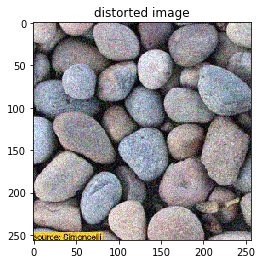

In [167]:
#input_img = content_i.clone()
"""

gaussian blur


"""

# imgn = cv2.imread("./data/texture/pebbles.jpg")
# imgn = cv2.GaussianBlur(imgn, ksize = (0, 0),sigmaX = (6.5))


# imgn = cv_converter(imgn)

"""

gaussian noise


"""

k = 9
ref = ref
noise = torch.randn(1,nc,imsize,imsize)*torch.sqrt((torch.tensor([2.0])**k))/ torch.tensor(255.0) 
imgn = ref+noise.to(device)
imgn = torch.clamp(imgn,0,1)


"""

jpeg

"""
plt.figure()
imshow1(imgn, title='distorted image')

In [170]:
noise.max()

tensor(0.4161)

/home/x227guo/.virtualenvs/a613/lib/python3.6/site-packages/ipykernel_launcher.py:52: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
/home/x227guo/.virtualenvs/a613/lib/python3.6/site-packages/ipykernel_launcher.py:53: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


loss1 tensor(15.2022, device='cuda:0', grad_fn=<DivBackward0>)


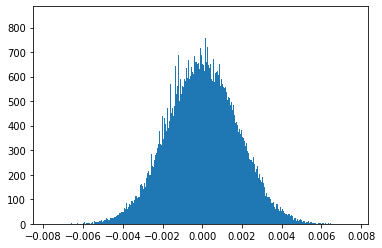

g1 tensor(0.0076, device='cuda:0') tensor(-0.0078, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(2935.4841, device='cuda:0', grad_fn=<AddBackward0>)


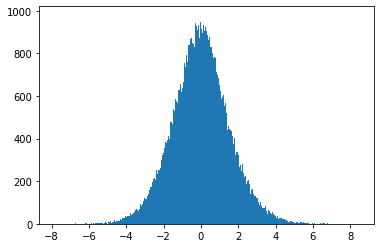

g2 tensor(8.4714, device='cuda:0') tensor(-7.8464, device='cuda:0') tensor(1.1944, device='cuda:0')


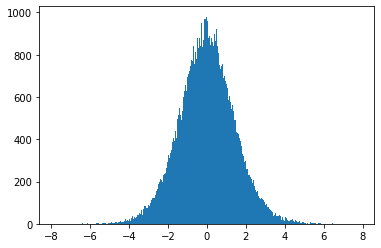

gm tensor(7.8092, device='cuda:0') tensor(-7.8352, device='cuda:0') tensor(1.1227, device='cuda:0')
xm-img: tensor(17.9847, device='cuda:0')
gn tensor(0.0077, device='cuda:0') tensor(-0.0081, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.4128, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.5257, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.4332, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.3403, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.2472, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.1538, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.0601, device='cuda:0', grad_fn=<AbsBackward>)
y-img tensor(15.8822, device='cuda:0')
cumulate comp: tensor(0.0100, device='cuda:0', grad_fn=<AddBackward0>)


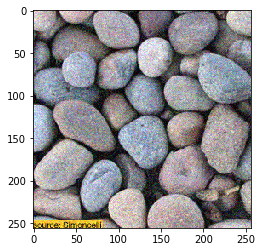

loss1 tensor(15.1922, device='cuda:0', grad_fn=<DivBackward0>)


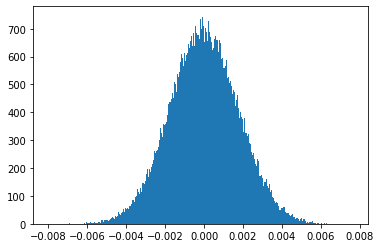

g1 tensor(0.0076, device='cuda:0') tensor(-0.0080, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(985.0074, device='cuda:0', grad_fn=<AddBackward0>)


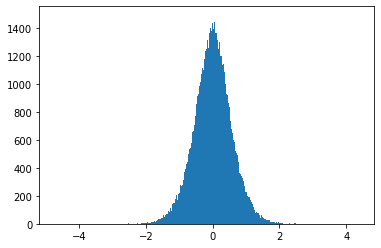

g2 tensor(4.3830, device='cuda:0') tensor(-4.7360, device='cuda:0') tensor(0.4388, device='cuda:0')


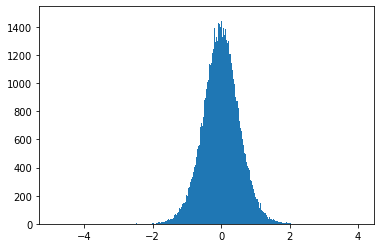

gm tensor(4.0289, device='cuda:0') tensor(-4.8622, device='cuda:0') tensor(0.4146, device='cuda:0')
xm-img: tensor(5.1335, device='cuda:0')
gn tensor(0.0077, device='cuda:0') tensor(-0.0081, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0565, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.8600, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.7697, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.6790, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.5881, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.4968, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4053, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3135, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2214, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.29993

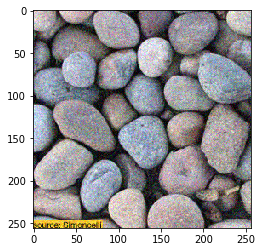

loss1 tensor(15.1823, device='cuda:0', grad_fn=<DivBackward0>)


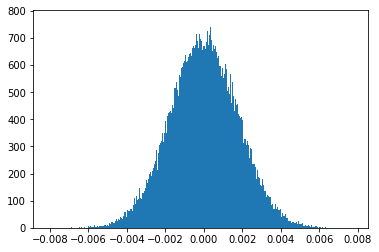

g1 tensor(0.0077, device='cuda:0') tensor(-0.0081, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(571.1717, device='cuda:0', grad_fn=<AddBackward0>)


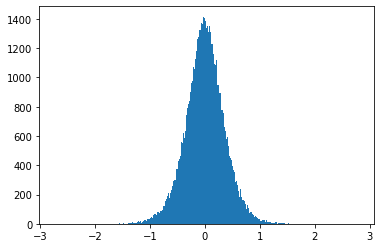

g2 tensor(2.8032, device='cuda:0') tensor(-2.7299, device='cuda:0') tensor(0.2729, device='cuda:0')


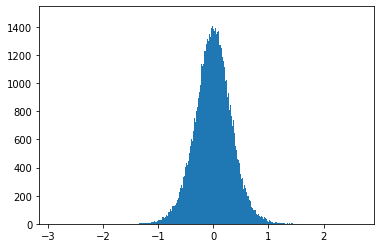

gm tensor(2.6437, device='cuda:0') tensor(-2.8755, device='cuda:0') tensor(0.2592, device='cuda:0')
xm-img: tensor(2.3974, device='cuda:0')
gn tensor(0.0078, device='cuda:0') tensor(-0.0081, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0223, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.8915, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8014, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7110, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6203, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5294, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4381, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3466, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2548, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.29993

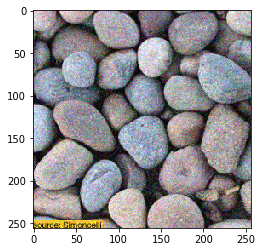

loss1 tensor(15.1723, device='cuda:0', grad_fn=<DivBackward0>)


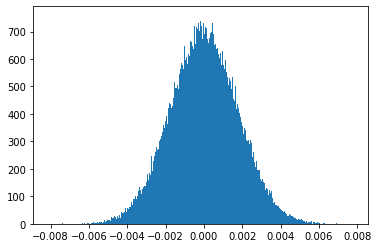

g1 tensor(0.0078, device='cuda:0') tensor(-0.0081, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(391.8137, device='cuda:0', grad_fn=<AddBackward0>)


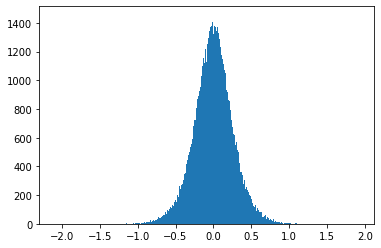

g2 tensor(1.9194, device='cuda:0') tensor(-2.0931, device='cuda:0') tensor(0.1988, device='cuda:0')


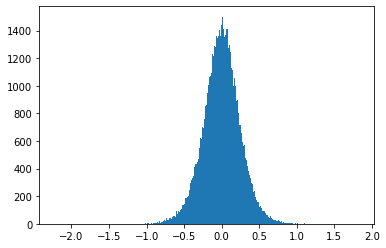

gm tensor(1.8313, device='cuda:0') tensor(-2.2241, device='cuda:0') tensor(0.1893, device='cuda:0')
xm-img: tensor(1.2449, device='cuda:0')
gn tensor(0.0078, device='cuda:0') tensor(-0.0081, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0120, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9006, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8106, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7203, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6298, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5389, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4478, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3564, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2647, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.29993

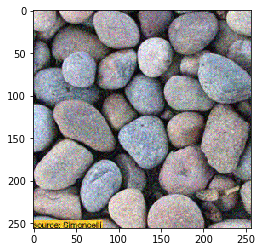

loss1 tensor(15.1623, device='cuda:0', grad_fn=<DivBackward0>)


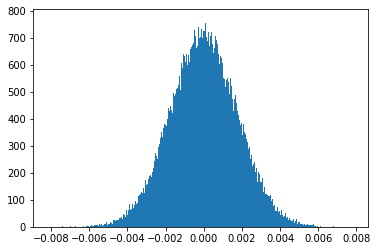

g1 tensor(0.0078, device='cuda:0') tensor(-0.0081, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(292.1519, device='cuda:0', grad_fn=<AddBackward0>)


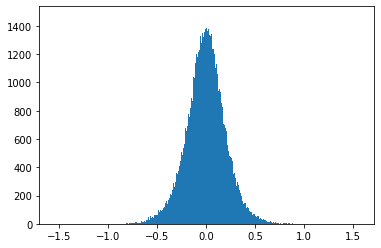

g2 tensor(1.5652, device='cuda:0') tensor(-1.5461, device='cuda:0') tensor(0.1545, device='cuda:0')


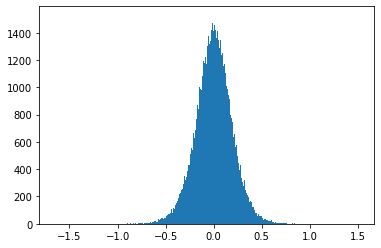

gm tensor(1.5113, device='cuda:0') tensor(-1.6540, device='cuda:0') tensor(0.1474, device='cuda:0')
xm-img: tensor(0.6181, device='cuda:0')
gn tensor(0.0078, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0073, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9044, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8145, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7243, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6339, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5431, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4521, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3607, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2691, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.29993

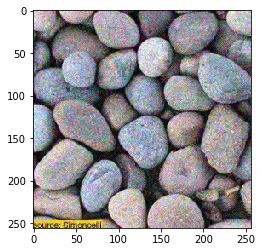

loss1 tensor(15.1550, device='cuda:0', grad_fn=<DivBackward0>)


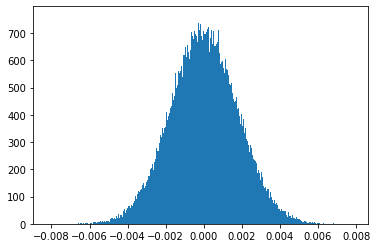

g1 tensor(0.0078, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(230.3829, device='cuda:0', grad_fn=<AddBackward0>)


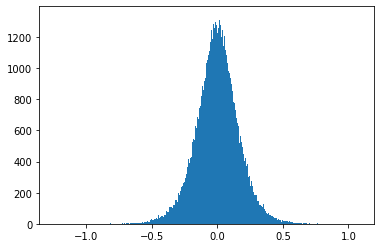

g2 tensor(1.0803, device='cuda:0') tensor(-1.2377, device='cuda:0') tensor(0.1250, device='cuda:0')


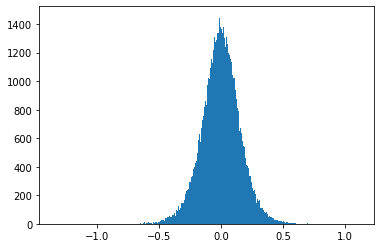

gm tensor(1.1147, device='cuda:0') tensor(-1.3411, device='cuda:0') tensor(0.1193, device='cuda:0')
xm-img: tensor(0.2478, device='cuda:0')
gn tensor(0.0078, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0048, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9063, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8165, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7264, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6359, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5452, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4543, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3630, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2715, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.29993

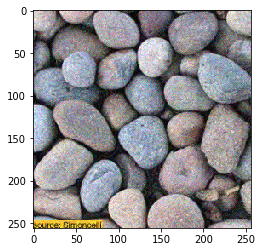

loss1 tensor(15.1503, device='cuda:0', grad_fn=<DivBackward0>)


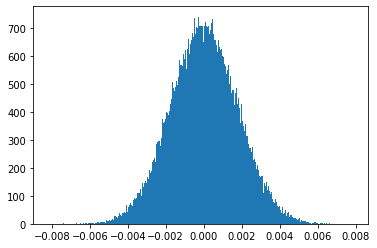

g1 tensor(0.0078, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(189.1839, device='cuda:0', grad_fn=<AddBackward0>)


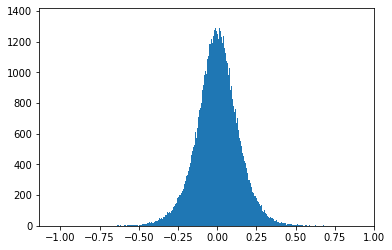

g2 tensor(0.9037, device='cuda:0') tensor(-1.0365, device='cuda:0') tensor(0.1041, device='cuda:0')


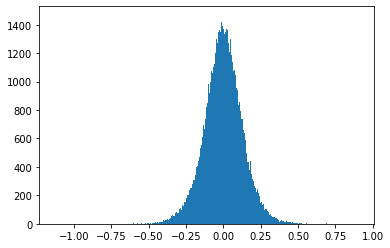

gm tensor(0.9091, device='cuda:0') tensor(-1.1290, device='cuda:0') tensor(0.0993, device='cuda:0')
xm-img: tensor(0.0145, device='cuda:0')
gn tensor(0.0079, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0034, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9074, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8176, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7275, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6372, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5465, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4555, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3643, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2728, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.29993

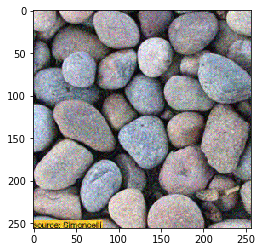

loss1 tensor(15.1469, device='cuda:0', grad_fn=<DivBackward0>)


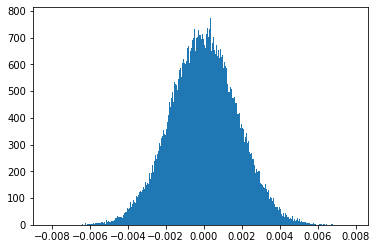

g1 tensor(0.0079, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(160.2521, device='cuda:0', grad_fn=<AddBackward0>)


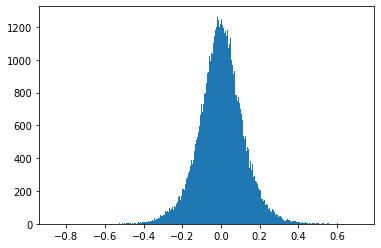

g2 tensor(0.7140, device='cuda:0') tensor(-0.8594, device='cuda:0') tensor(0.0887, device='cuda:0')


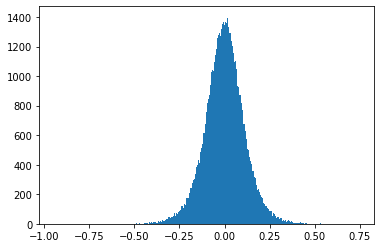

gm tensor(0.7468, device='cuda:0') tensor(-0.9429, device='cuda:0') tensor(0.0847, device='cuda:0')
xm-img: tensor(-0.1525, device='cuda:0')
gn tensor(0.0079, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0024, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9081, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8183, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7282, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6379, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5473, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4563, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3651, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2737, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

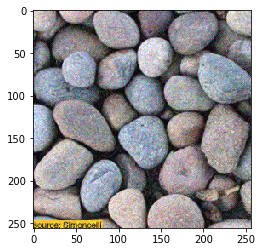

loss1 tensor(15.1445, device='cuda:0', grad_fn=<DivBackward0>)


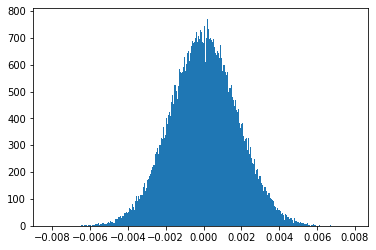

g1 tensor(0.0079, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(139.0512, device='cuda:0', grad_fn=<AddBackward0>)


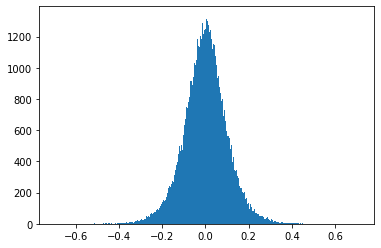

g2 tensor(0.7106, device='cuda:0') tensor(-0.6965, device='cuda:0') tensor(0.0770, device='cuda:0')


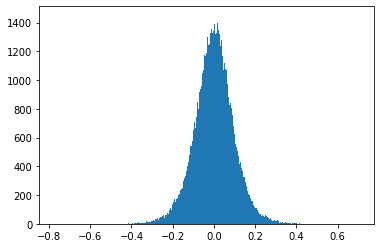

gm tensor(0.7039, device='cuda:0') tensor(-0.7725, device='cuda:0') tensor(0.0734, device='cuda:0')
xm-img: tensor(-0.2742, device='cuda:0')
gn tensor(0.0079, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0018, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9085, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8188, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7287, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6384, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5477, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4568, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3657, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2742, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

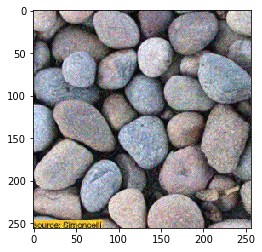

loss1 tensor(15.1427, device='cuda:0', grad_fn=<DivBackward0>)


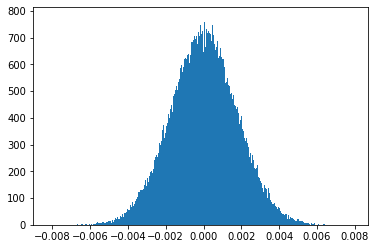

g1 tensor(0.0079, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(123.0520, device='cuda:0', grad_fn=<AddBackward0>)


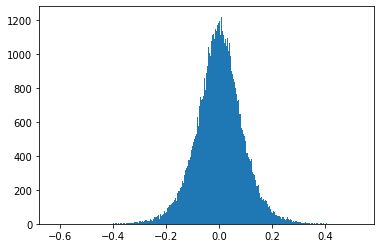

g2 tensor(0.5266, device='cuda:0') tensor(-0.6190, device='cuda:0') tensor(0.0676, device='cuda:0')


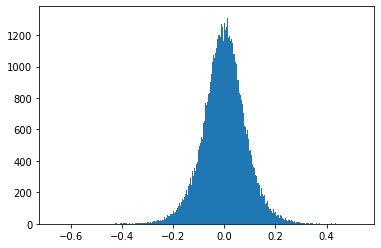

gm tensor(0.5271, device='cuda:0') tensor(-0.6628, device='cuda:0') tensor(0.0644, device='cuda:0')
xm-img: tensor(-0.3632, device='cuda:0')
gn tensor(0.0079, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0014, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9088, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8190, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7290, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6387, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5481, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4572, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3660, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2746, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

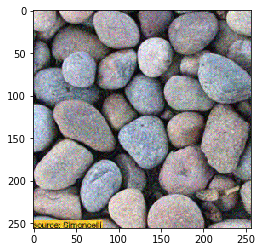

loss1 tensor(15.1414, device='cuda:0', grad_fn=<DivBackward0>)


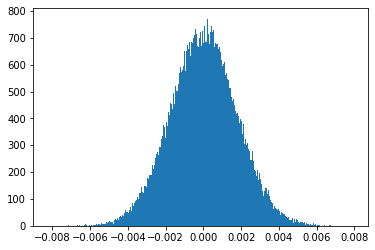

g1 tensor(0.0079, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(110.6462, device='cuda:0', grad_fn=<AddBackward0>)


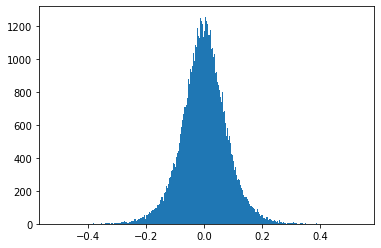

g2 tensor(0.5335, device='cuda:0') tensor(-0.5138, device='cuda:0') tensor(0.0601, device='cuda:0')


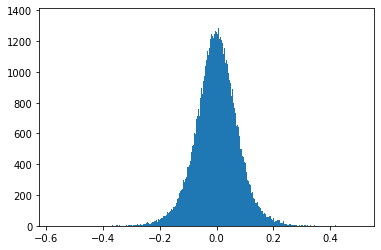

gm tensor(0.5016, device='cuda:0') tensor(-0.5701, device='cuda:0') tensor(0.0572, device='cuda:0')
xm-img: tensor(-0.4283, device='cuda:0')
gn tensor(0.0079, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0011, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9090, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8193, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7292, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6389, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5483, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4575, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3663, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2749, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

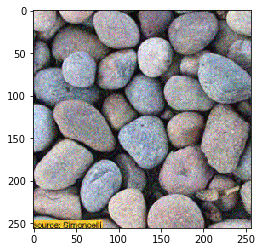

loss1 tensor(15.1403, device='cuda:0', grad_fn=<DivBackward0>)


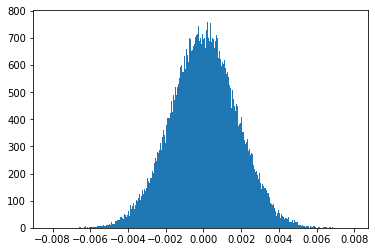

g1 tensor(0.0079, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(100.8156, device='cuda:0', grad_fn=<AddBackward0>)


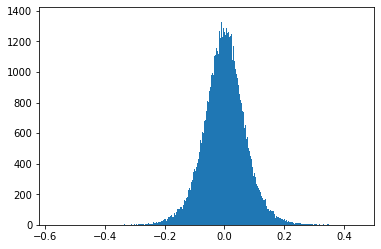

g2 tensor(0.4511, device='cuda:0') tensor(-0.5684, device='cuda:0') tensor(0.0540, device='cuda:0')


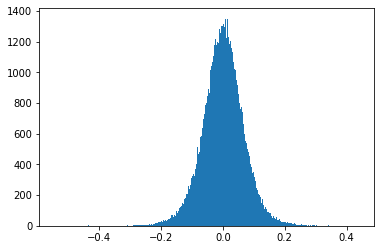

gm tensor(0.4404, device='cuda:0') tensor(-0.5447, device='cuda:0') tensor(0.0513, device='cuda:0')
xm-img: tensor(-0.4832, device='cuda:0')
gn tensor(0.0079, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0009, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9091, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8194, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7294, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6391, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5485, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4576, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3665, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2750, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

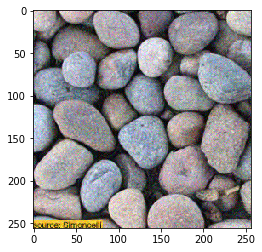

loss1 tensor(15.1395, device='cuda:0', grad_fn=<DivBackward0>)


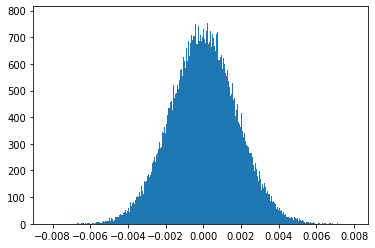

g1 tensor(0.0079, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(92.8568, device='cuda:0', grad_fn=<AddBackward0>)


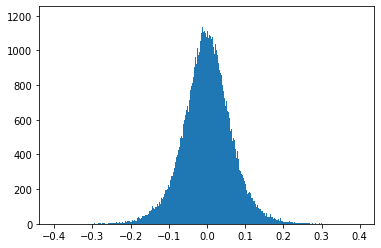

g2 tensor(0.3982, device='cuda:0') tensor(-0.3990, device='cuda:0') tensor(0.0491, device='cuda:0')


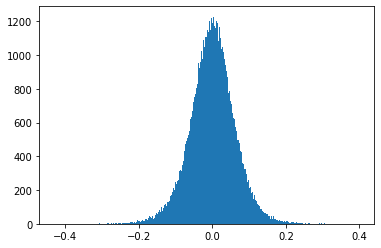

gm tensor(0.3989, device='cuda:0') tensor(-0.4287, device='cuda:0') tensor(0.0466, device='cuda:0')
xm-img: tensor(-0.5193, device='cuda:0')
gn tensor(0.0079, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0007, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9093, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8195, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7295, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6392, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5486, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4578, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3666, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2752, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

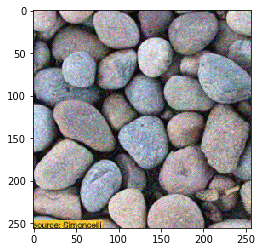

loss1 tensor(15.1388, device='cuda:0', grad_fn=<DivBackward0>)


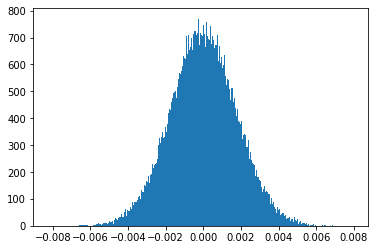

g1 tensor(0.0079, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(86.2976, device='cuda:0', grad_fn=<AddBackward0>)


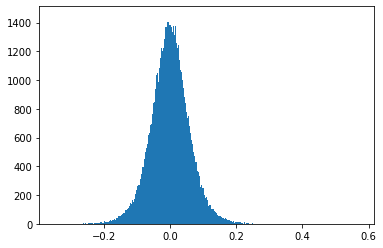

g2 tensor(0.5709, device='cuda:0') tensor(-0.3475, device='cuda:0') tensor(0.0449, device='cuda:0')


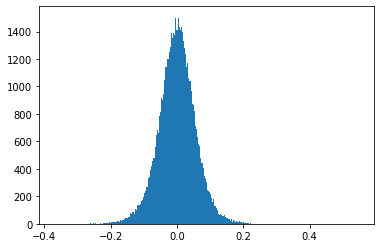

gm tensor(0.5493, device='cuda:0') tensor(-0.3689, device='cuda:0') tensor(0.0426, device='cuda:0')
xm-img: tensor(-0.5462, device='cuda:0')
gn tensor(0.0079, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0006, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9093, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8196, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7296, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6393, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5487, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4579, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3667, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2753, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

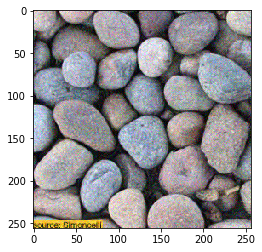

loss1 tensor(15.1383, device='cuda:0', grad_fn=<DivBackward0>)


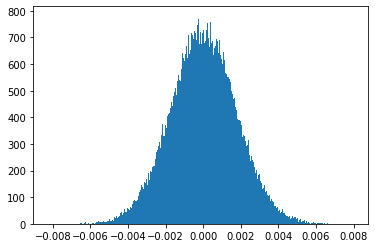

g1 tensor(0.0079, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(80.8117, device='cuda:0', grad_fn=<AddBackward0>)


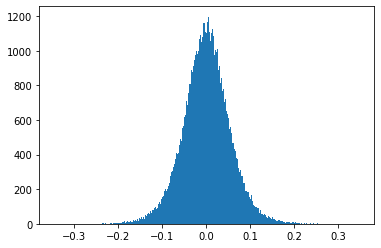

g2 tensor(0.3474, device='cuda:0') tensor(-0.3442, device='cuda:0') tensor(0.0414, device='cuda:0')


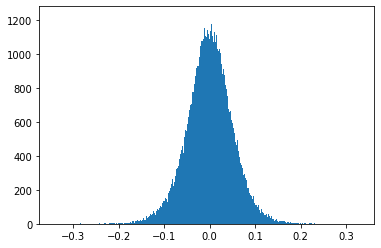

gm tensor(0.3286, device='cuda:0') tensor(-0.3406, device='cuda:0') tensor(0.0392, device='cuda:0')
xm-img: tensor(-0.5666, device='cuda:0')
gn tensor(0.0080, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0005, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9094, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8197, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7296, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6394, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5488, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4579, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3668, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2754, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

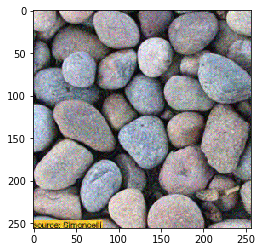

loss1 tensor(15.1378, device='cuda:0', grad_fn=<DivBackward0>)


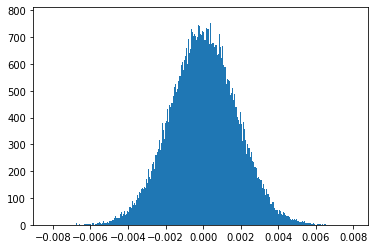

g1 tensor(0.0080, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(76.1468, device='cuda:0', grad_fn=<AddBackward0>)


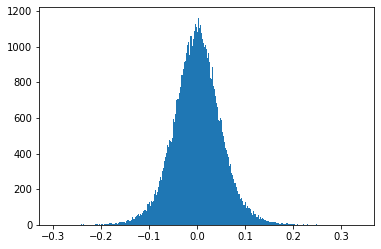

g2 tensor(0.3367, device='cuda:0') tensor(-0.2956, device='cuda:0') tensor(0.0385, device='cuda:0')


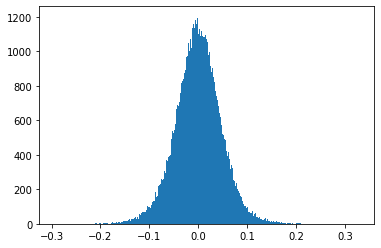

gm tensor(0.3292, device='cuda:0') tensor(-0.2935, device='cuda:0') tensor(0.0363, device='cuda:0')
xm-img: tensor(-0.5859, device='cuda:0')
gn tensor(0.0080, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0004, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9094, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8197, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7297, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6394, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5488, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4580, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3669, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2754, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

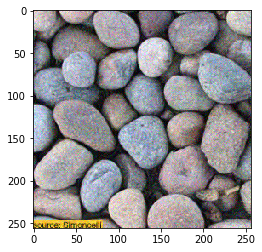

loss1 tensor(15.1374, device='cuda:0', grad_fn=<DivBackward0>)


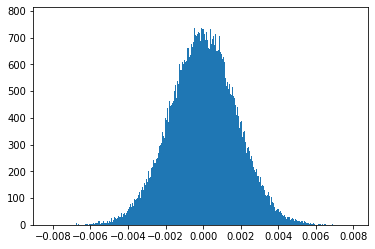

g1 tensor(0.0080, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(72.1402, device='cuda:0', grad_fn=<AddBackward0>)


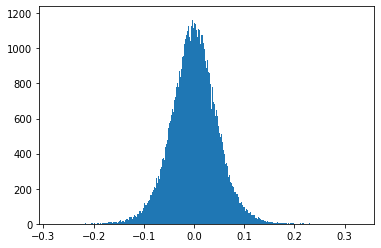

g2 tensor(0.3286, device='cuda:0') tensor(-0.2777, device='cuda:0') tensor(0.0359, device='cuda:0')


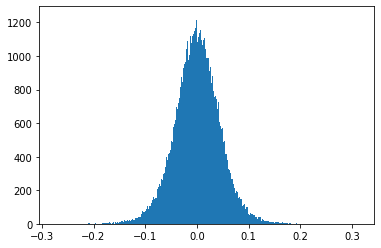

gm tensor(0.3132, device='cuda:0') tensor(-0.2751, device='cuda:0') tensor(0.0339, device='cuda:0')
xm-img: tensor(-0.5981, device='cuda:0')
gn tensor(0.0080, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0004, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9095, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8197, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7297, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6394, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5489, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4580, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3669, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2755, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

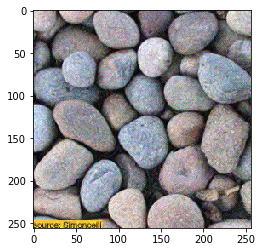

loss1 tensor(15.1371, device='cuda:0', grad_fn=<DivBackward0>)


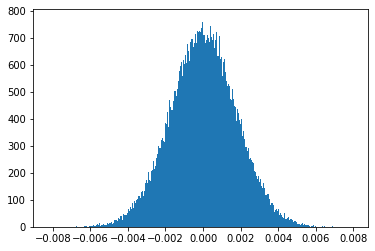

g1 tensor(0.0080, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(68.6516, device='cuda:0', grad_fn=<AddBackward0>)


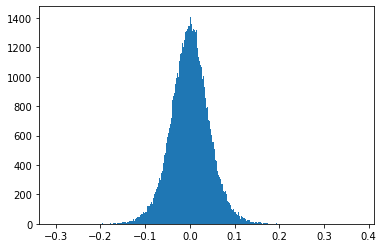

g2 tensor(0.3784, device='cuda:0') tensor(-0.3022, device='cuda:0') tensor(0.0337, device='cuda:0')


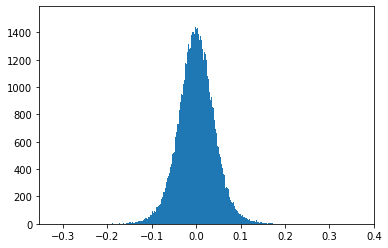

gm tensor(0.3666, device='cuda:0') tensor(-0.3183, device='cuda:0') tensor(0.0318, device='cuda:0')
xm-img: tensor(-0.6084, device='cuda:0')
gn tensor(0.0080, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0003, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9095, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8198, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7298, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6395, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5489, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4581, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3669, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2755, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

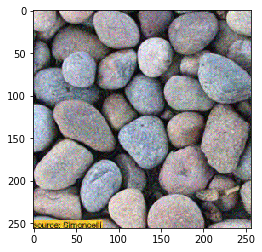

loss1 tensor(15.1368, device='cuda:0', grad_fn=<DivBackward0>)


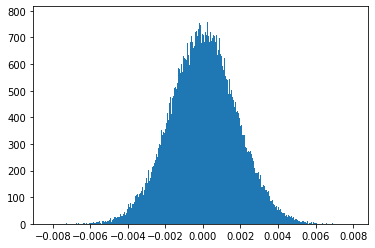

g1 tensor(0.0080, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(65.5840, device='cuda:0', grad_fn=<AddBackward0>)


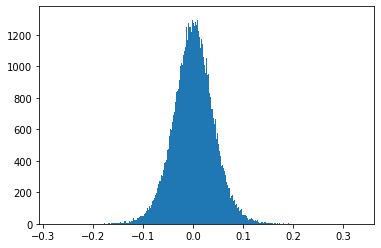

g2 tensor(0.3314, device='cuda:0') tensor(-0.2774, device='cuda:0') tensor(0.0318, device='cuda:0')


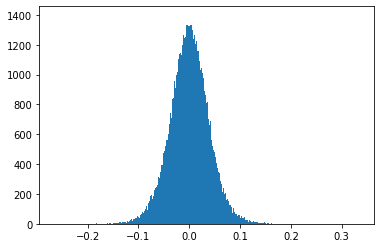

gm tensor(0.3343, device='cuda:0') tensor(-0.2650, device='cuda:0') tensor(0.0299, device='cuda:0')
xm-img: tensor(-0.6191, device='cuda:0')
gn tensor(0.0080, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0003, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9095, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8198, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7298, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6395, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5489, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4581, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3670, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2756, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

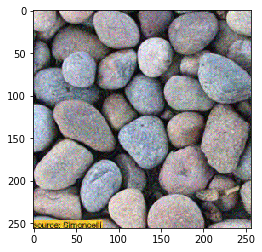

loss1 tensor(15.1366, device='cuda:0', grad_fn=<DivBackward0>)


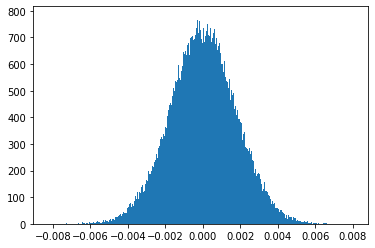

g1 tensor(0.0080, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(62.8622, device='cuda:0', grad_fn=<AddBackward0>)


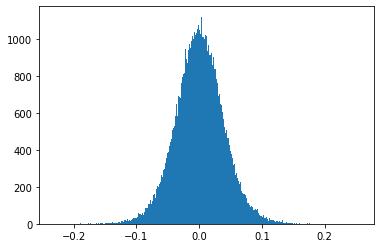

g2 tensor(0.2544, device='cuda:0') tensor(-0.2305, device='cuda:0') tensor(0.0301, device='cuda:0')


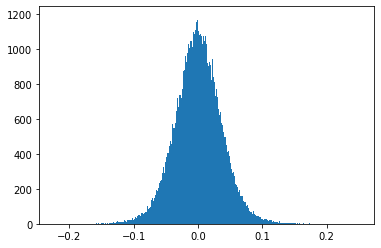

gm tensor(0.2502, device='cuda:0') tensor(-0.2229, device='cuda:0') tensor(0.0283, device='cuda:0')
xm-img: tensor(-0.6254, device='cuda:0')
gn tensor(0.0080, device='cuda:0') tensor(-0.0083, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0003, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9095, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8198, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7298, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6395, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5490, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4581, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3670, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2756, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

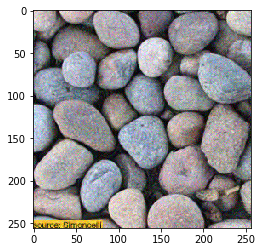

loss1 tensor(15.1363, device='cuda:0', grad_fn=<DivBackward0>)


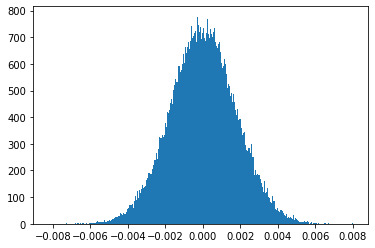

g1 tensor(0.0080, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(60.4275, device='cuda:0', grad_fn=<AddBackward0>)


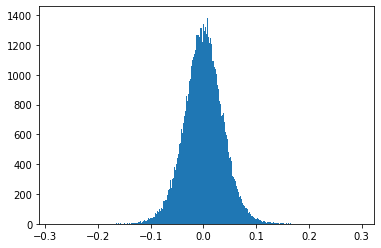

g2 tensor(0.2950, device='cuda:0') tensor(-0.2816, device='cuda:0') tensor(0.0286, device='cuda:0')


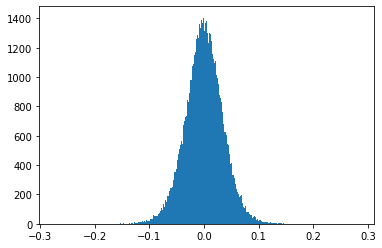

gm tensor(0.2839, device='cuda:0') tensor(-0.2732, device='cuda:0') tensor(0.0269, device='cuda:0')
xm-img: tensor(-0.6317, device='cuda:0')
gn tensor(0.0080, device='cuda:0') tensor(-0.0083, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0002, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9095, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8198, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7298, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6395, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5490, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4581, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3670, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2756, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

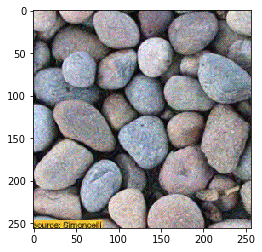

loss1 tensor(15.1362, device='cuda:0', grad_fn=<DivBackward0>)


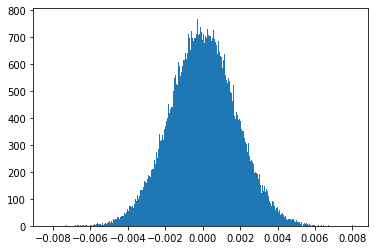

g1 tensor(0.0080, device='cuda:0') tensor(-0.0083, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(58.2293, device='cuda:0', grad_fn=<AddBackward0>)


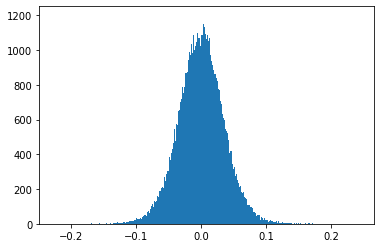

g2 tensor(0.2430, device='cuda:0') tensor(-0.2247, device='cuda:0') tensor(0.0273, device='cuda:0')


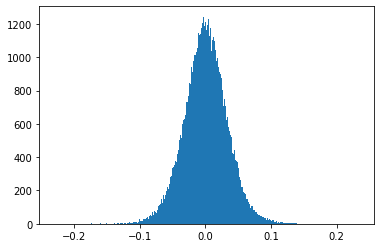

gm tensor(0.2339, device='cuda:0') tensor(-0.2297, device='cuda:0') tensor(0.0257, device='cuda:0')
xm-img: tensor(-0.6353, device='cuda:0')
gn tensor(0.0080, device='cuda:0') tensor(-0.0083, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0002, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9095, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8198, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7298, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5490, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4582, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3670, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2756, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

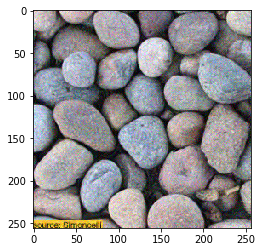

loss1 tensor(15.1360, device='cuda:0', grad_fn=<DivBackward0>)


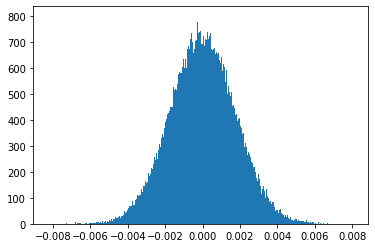

g1 tensor(0.0080, device='cuda:0') tensor(-0.0083, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(56.2243, device='cuda:0', grad_fn=<AddBackward0>)


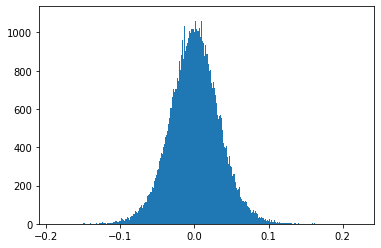

g2 tensor(0.2219, device='cuda:0') tensor(-0.1888, device='cuda:0') tensor(0.0261, device='cuda:0')


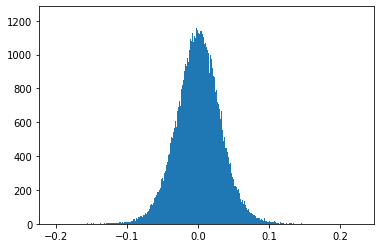

gm tensor(0.2267, device='cuda:0') tensor(-0.2024, device='cuda:0') tensor(0.0246, device='cuda:0')
xm-img: tensor(-0.6386, device='cuda:0')
gn tensor(0.0080, device='cuda:0') tensor(-0.0083, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0002, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9095, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8198, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7298, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5490, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4582, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3671, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2757, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

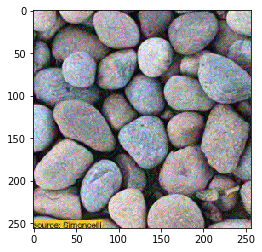

loss1 tensor(15.1359, device='cuda:0', grad_fn=<DivBackward0>)


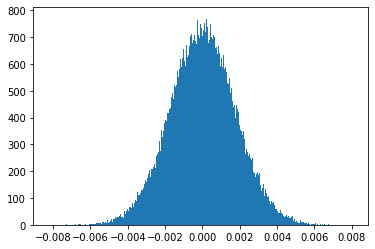

g1 tensor(0.0080, device='cuda:0') tensor(-0.0083, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(54.3924, device='cuda:0', grad_fn=<AddBackward0>)


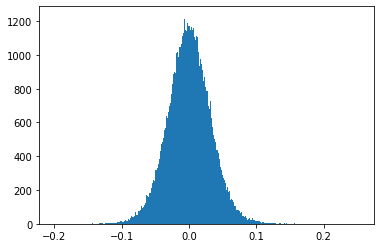

g2 tensor(0.2524, device='cuda:0') tensor(-0.1993, device='cuda:0') tensor(0.0251, device='cuda:0')


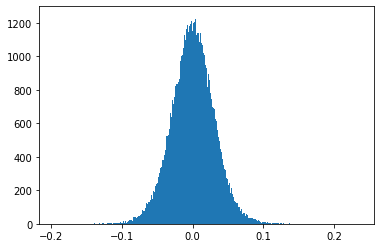

gm tensor(0.2349, device='cuda:0') tensor(-0.1948, device='cuda:0') tensor(0.0236, device='cuda:0')
xm-img: tensor(-0.6381, device='cuda:0')
gn tensor(0.0081, device='cuda:0') tensor(-0.0083, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0002, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9095, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8198, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7298, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5490, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4582, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3671, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2757, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

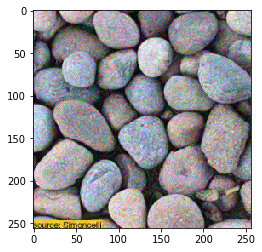

loss1 tensor(15.1357, device='cuda:0', grad_fn=<DivBackward0>)


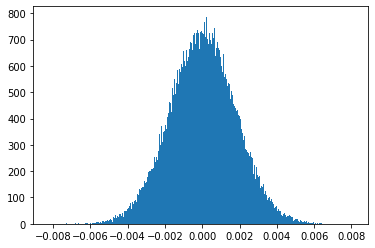

g1 tensor(0.0081, device='cuda:0') tensor(-0.0083, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(52.7043, device='cuda:0', grad_fn=<AddBackward0>)


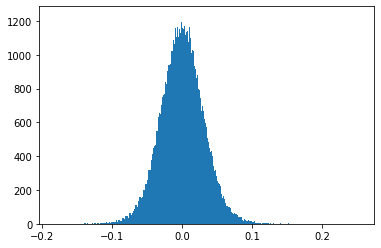

g2 tensor(0.2528, device='cuda:0') tensor(-0.1814, device='cuda:0') tensor(0.0241, device='cuda:0')


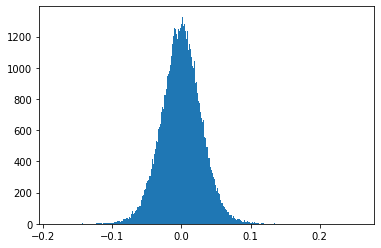

gm tensor(0.2568, device='cuda:0') tensor(-0.1830, device='cuda:0') tensor(0.0227, device='cuda:0')
xm-img: tensor(-0.6393, device='cuda:0')
gn tensor(0.0081, device='cuda:0') tensor(-0.0083, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0002, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8198, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5490, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4582, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3671, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2757, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

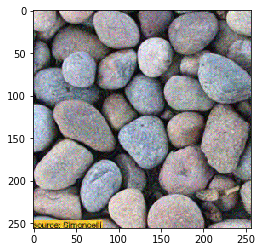

loss1 tensor(15.1356, device='cuda:0', grad_fn=<DivBackward0>)


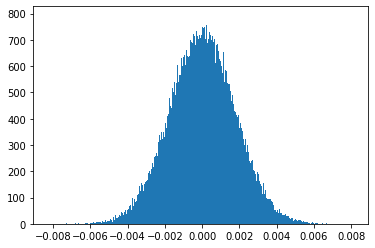

g1 tensor(0.0081, device='cuda:0') tensor(-0.0083, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(51.1432, device='cuda:0', grad_fn=<AddBackward0>)


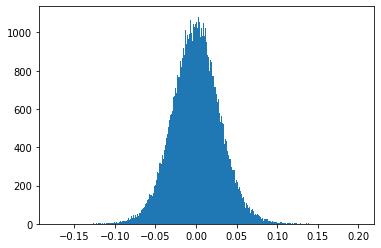

g2 tensor(0.2005, device='cuda:0') tensor(-0.1739, device='cuda:0') tensor(0.0233, device='cuda:0')


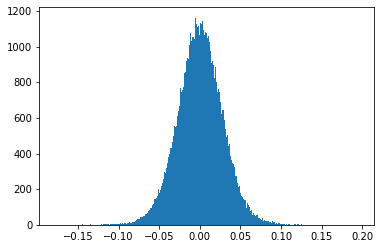

gm tensor(0.1959, device='cuda:0') tensor(-0.1787, device='cuda:0') tensor(0.0219, device='cuda:0')
xm-img: tensor(-0.6419, device='cuda:0')
gn tensor(0.0081, device='cuda:0') tensor(-0.0083, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0002, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8198, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5490, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4582, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3671, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2757, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

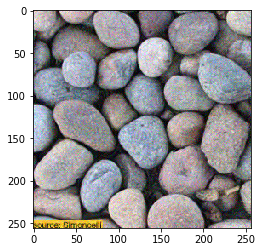

loss1 tensor(15.1355, device='cuda:0', grad_fn=<DivBackward0>)


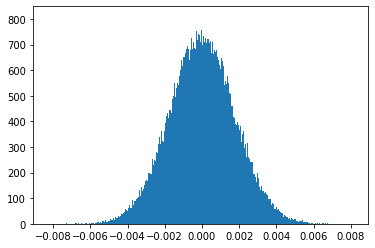

g1 tensor(0.0081, device='cuda:0') tensor(-0.0083, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(49.6913, device='cuda:0', grad_fn=<AddBackward0>)


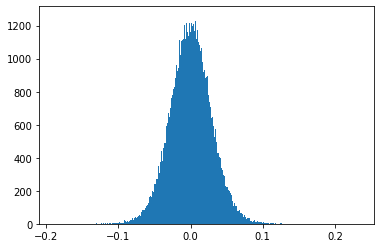

g2 tensor(0.2334, device='cuda:0') tensor(-0.1883, device='cuda:0') tensor(0.0225, device='cuda:0')


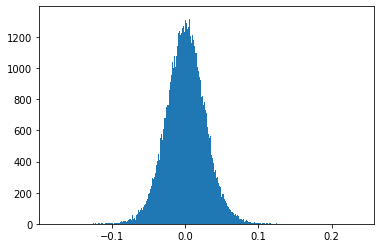

gm tensor(0.2375, device='cuda:0') tensor(-0.1787, device='cuda:0') tensor(0.0211, device='cuda:0')
xm-img: tensor(-0.6407, device='cuda:0')
gn tensor(0.0081, device='cuda:0') tensor(-0.0083, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0001, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5490, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4582, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3671, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2757, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

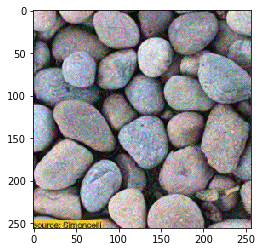

loss1 tensor(15.1354, device='cuda:0', grad_fn=<DivBackward0>)


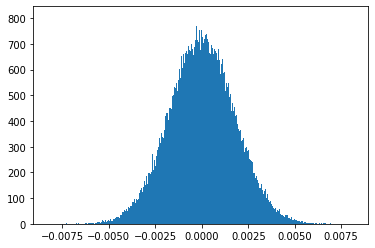

g1 tensor(0.0081, device='cuda:0') tensor(-0.0083, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(48.3351, device='cuda:0', grad_fn=<AddBackward0>)


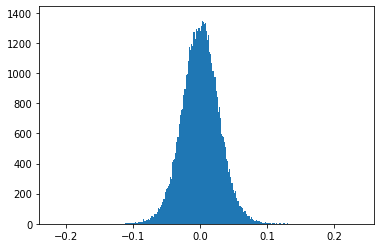

g2 tensor(0.2366, device='cuda:0') tensor(-0.2171, device='cuda:0') tensor(0.0218, device='cuda:0')


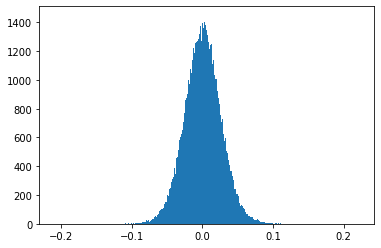

gm tensor(0.2219, device='cuda:0') tensor(-0.2095, device='cuda:0') tensor(0.0205, device='cuda:0')
xm-img: tensor(-0.6395, device='cuda:0')
gn tensor(0.0081, device='cuda:0') tensor(-0.0083, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0001, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5490, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4582, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3671, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2757, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

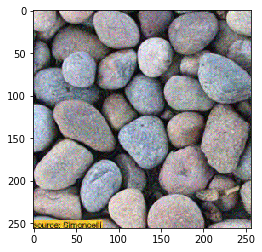

loss1 tensor(15.1353, device='cuda:0', grad_fn=<DivBackward0>)


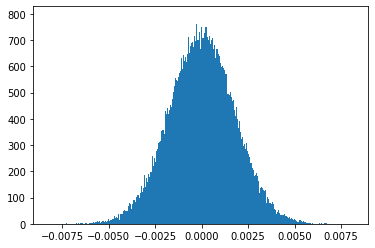

g1 tensor(0.0081, device='cuda:0') tensor(-0.0083, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(47.0641, device='cuda:0', grad_fn=<AddBackward0>)


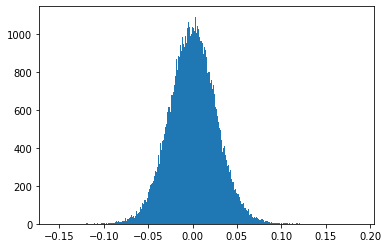

g2 tensor(0.1875, device='cuda:0') tensor(-0.1555, device='cuda:0') tensor(0.0211, device='cuda:0')


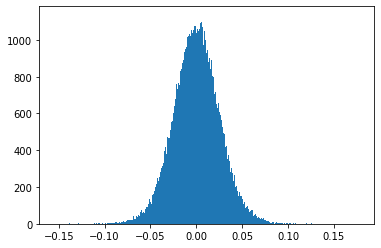

gm tensor(0.1774, device='cuda:0') tensor(-0.1546, device='cuda:0') tensor(0.0198, device='cuda:0')
xm-img: tensor(-0.6392, device='cuda:0')
gn tensor(0.0081, device='cuda:0') tensor(-0.0083, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0001, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4582, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3671, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2757, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

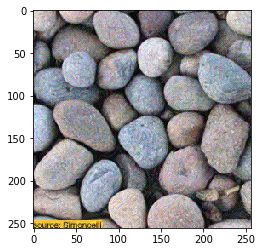

loss1 tensor(15.1352, device='cuda:0', grad_fn=<DivBackward0>)


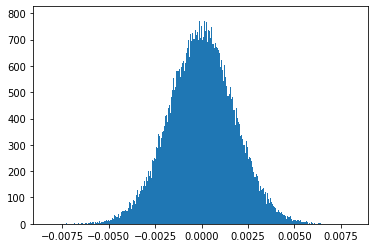

g1 tensor(0.0081, device='cuda:0') tensor(-0.0083, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(45.8671, device='cuda:0', grad_fn=<AddBackward0>)


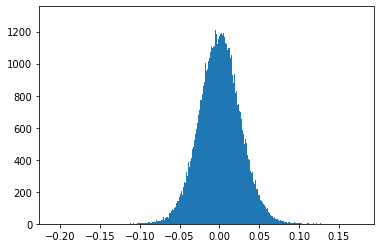

g2 tensor(0.1752, device='cuda:0') tensor(-0.2066, device='cuda:0') tensor(0.0205, device='cuda:0')


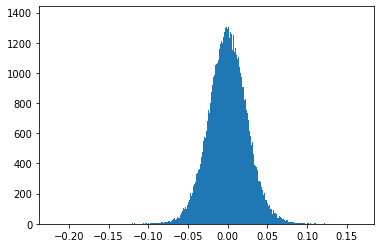

gm tensor(0.1656, device='cuda:0') tensor(-0.2180, device='cuda:0') tensor(0.0193, device='cuda:0')
xm-img: tensor(-0.6367, device='cuda:0')
gn tensor(0.0082, device='cuda:0') tensor(-0.0083, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0001, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4582, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3671, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2757, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

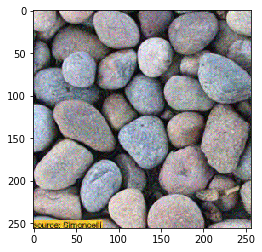

loss1 tensor(15.1351, device='cuda:0', grad_fn=<DivBackward0>)


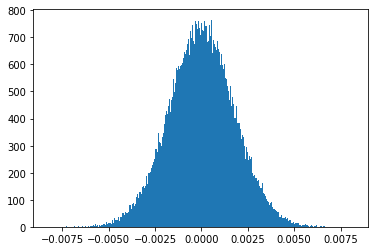

g1 tensor(0.0082, device='cuda:0') tensor(-0.0083, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(44.7409, device='cuda:0', grad_fn=<AddBackward0>)


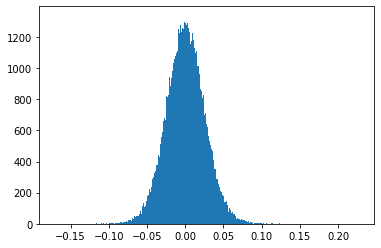

g2 tensor(0.2275, device='cuda:0') tensor(-0.1708, device='cuda:0') tensor(0.0199, device='cuda:0')


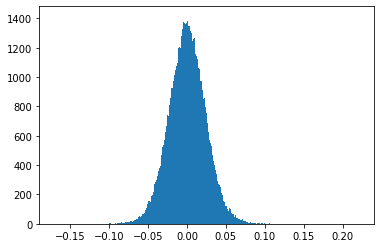

gm tensor(0.2211, device='cuda:0') tensor(-0.1701, device='cuda:0') tensor(0.0187, device='cuda:0')
xm-img: tensor(-0.6364, device='cuda:0')
gn tensor(0.0082, device='cuda:0') tensor(-0.0083, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0001, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4582, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3671, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2757, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

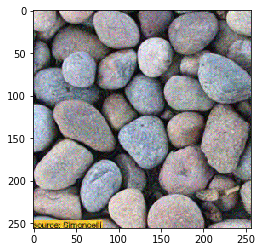

loss1 tensor(15.1351, device='cuda:0', grad_fn=<DivBackward0>)


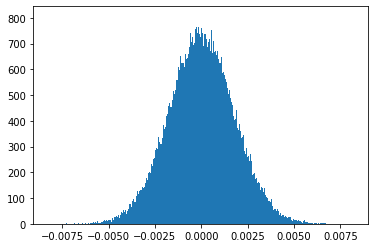

g1 tensor(0.0082, device='cuda:0') tensor(-0.0083, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(43.6741, device='cuda:0', grad_fn=<AddBackward0>)


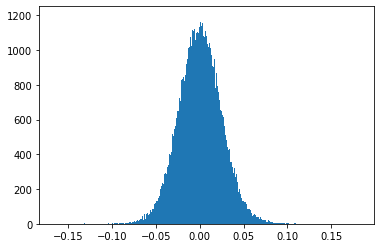

g2 tensor(0.1817, device='cuda:0') tensor(-0.1656, device='cuda:0') tensor(0.0194, device='cuda:0')


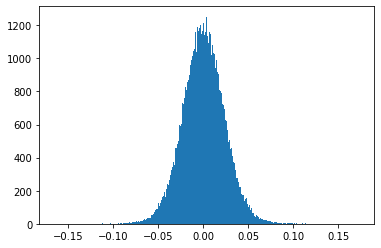

gm tensor(0.1730, device='cuda:0') tensor(-0.1649, device='cuda:0') tensor(0.0183, device='cuda:0')
xm-img: tensor(-0.6345, device='cuda:0')
gn tensor(0.0082, device='cuda:0') tensor(-0.0083, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0001, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4582, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3671, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2757, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

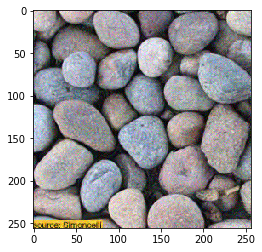

loss1 tensor(15.1350, device='cuda:0', grad_fn=<DivBackward0>)


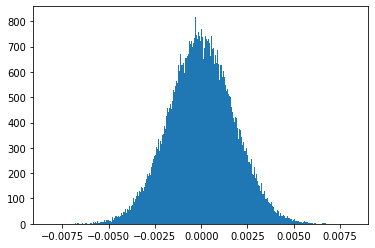

g1 tensor(0.0082, device='cuda:0') tensor(-0.0083, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(42.6622, device='cuda:0', grad_fn=<AddBackward0>)


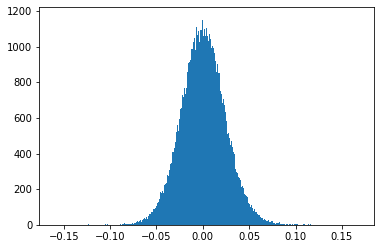

g2 tensor(0.1685, device='cuda:0') tensor(-0.1598, device='cuda:0') tensor(0.0189, device='cuda:0')


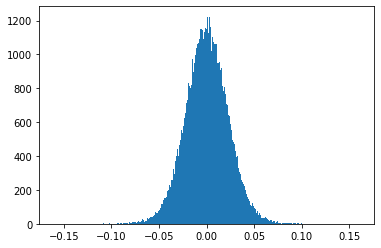

gm tensor(0.1602, device='cuda:0') tensor(-0.1596, device='cuda:0') tensor(0.0178, device='cuda:0')
xm-img: tensor(-0.6324, device='cuda:0')
gn tensor(0.0082, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(0.0001, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4582, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3671, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2757, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.2999

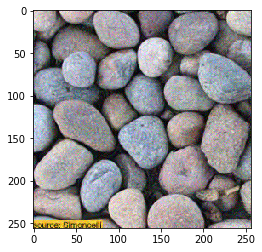

loss1 tensor(15.1350, device='cuda:0', grad_fn=<DivBackward0>)


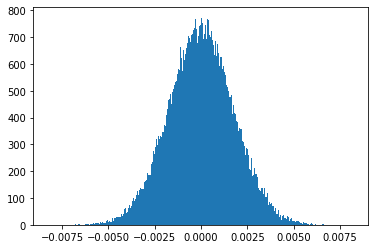

g1 tensor(0.0082, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(41.6997, device='cuda:0', grad_fn=<AddBackward0>)


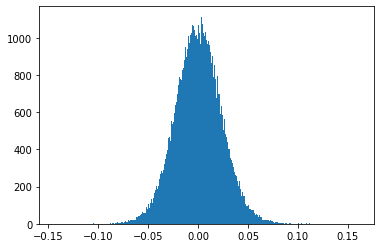

g2 tensor(0.1611, device='cuda:0') tensor(-0.1439, device='cuda:0') tensor(0.0185, device='cuda:0')


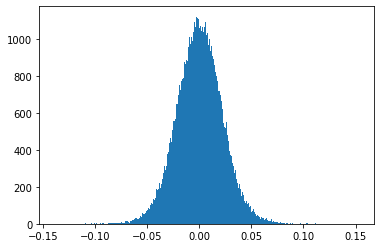

gm tensor(0.1532, device='cuda:0') tensor(-0.1388, device='cuda:0') tensor(0.0174, device='cuda:0')
xm-img: tensor(-0.6312, device='cuda:0')
gn tensor(0.0082, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(9.9182e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4582, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3671, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2757, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

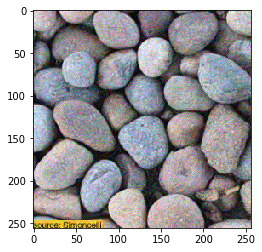

loss1 tensor(15.1350, device='cuda:0', grad_fn=<DivBackward0>)


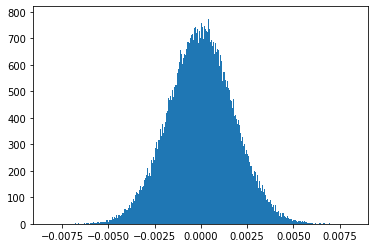

g1 tensor(0.0082, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(40.7824, device='cuda:0', grad_fn=<AddBackward0>)


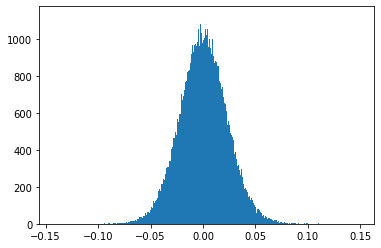

g2 tensor(0.1486, device='cuda:0') tensor(-0.1415, device='cuda:0') tensor(0.0180, device='cuda:0')


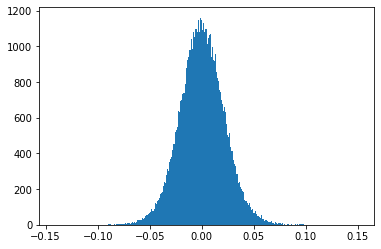

gm tensor(0.1514, device='cuda:0') tensor(-0.1414, device='cuda:0') tensor(0.0169, device='cuda:0')
xm-img: tensor(-0.6273, device='cuda:0')
gn tensor(0.0082, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(9.3460e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4582, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3671, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2757, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

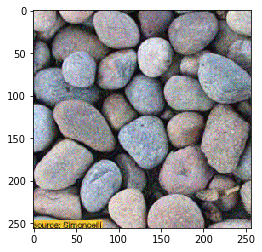

loss1 tensor(15.1349, device='cuda:0', grad_fn=<DivBackward0>)


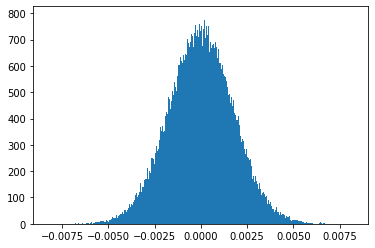

g1 tensor(0.0082, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(39.9087, device='cuda:0', grad_fn=<AddBackward0>)


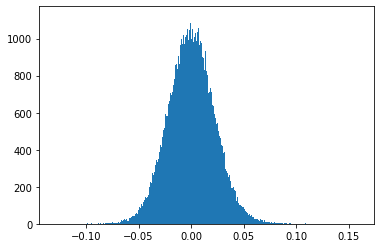

g2 tensor(0.1597, device='cuda:0') tensor(-0.1299, device='cuda:0') tensor(0.0176, device='cuda:0')


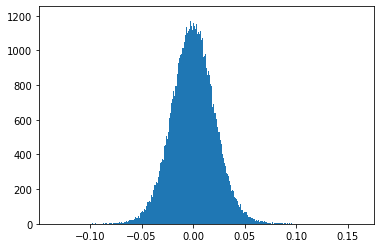

gm tensor(0.1611, device='cuda:0') tensor(-0.1343, device='cuda:0') tensor(0.0166, device='cuda:0')
xm-img: tensor(-0.6241, device='cuda:0')
gn tensor(0.0082, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(8.9645e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4582, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3671, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2757, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

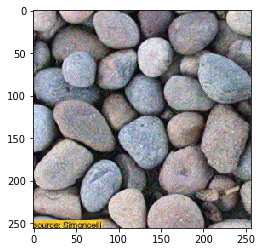

loss1 tensor(15.1349, device='cuda:0', grad_fn=<DivBackward0>)


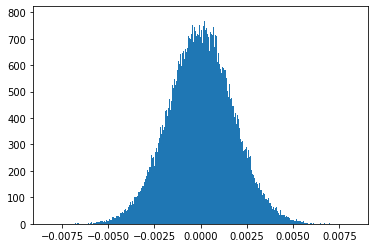

g1 tensor(0.0082, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(39.0729, device='cuda:0', grad_fn=<AddBackward0>)


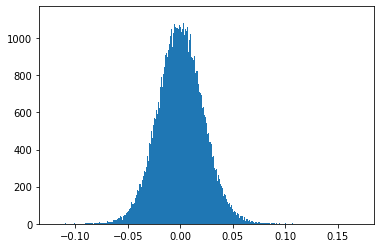

g2 tensor(0.1701, device='cuda:0') tensor(-0.1197, device='cuda:0') tensor(0.0172, device='cuda:0')


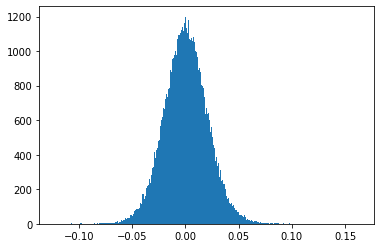

gm tensor(0.1630, device='cuda:0') tensor(-0.1229, device='cuda:0') tensor(0.0162, device='cuda:0')
xm-img: tensor(-0.6203, device='cuda:0')
gn tensor(0.0082, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(8.4877e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4583, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3671, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2757, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

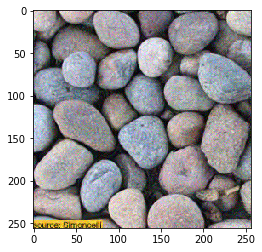

loss1 tensor(15.1348, device='cuda:0', grad_fn=<DivBackward0>)


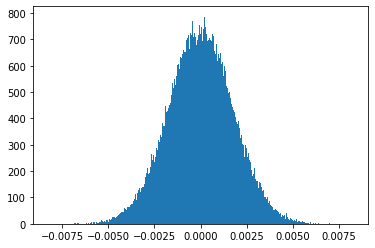

g1 tensor(0.0082, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(38.2730, device='cuda:0', grad_fn=<AddBackward0>)


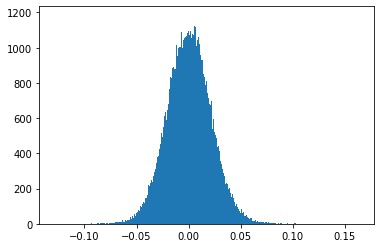

g2 tensor(0.1636, device='cuda:0') tensor(-0.1286, device='cuda:0') tensor(0.0169, device='cuda:0')


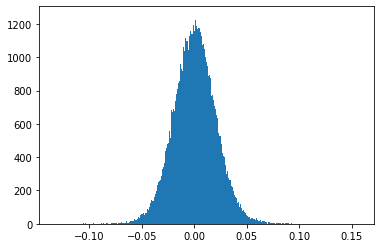

gm tensor(0.1569, device='cuda:0') tensor(-0.1330, device='cuda:0') tensor(0.0158, device='cuda:0')
xm-img: tensor(-0.6174, device='cuda:0')
gn tensor(0.0082, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(8.1062e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4583, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3671, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2757, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

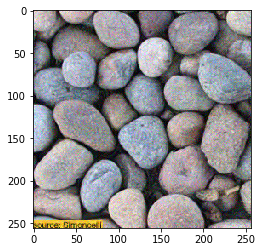

loss1 tensor(15.1348, device='cuda:0', grad_fn=<DivBackward0>)


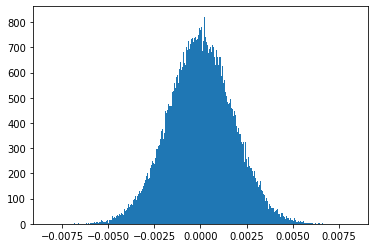

g1 tensor(0.0082, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(37.5060, device='cuda:0', grad_fn=<AddBackward0>)


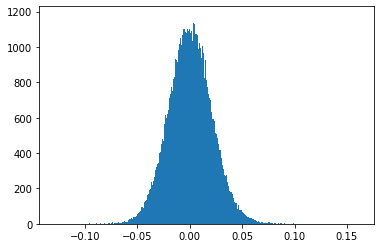

g2 tensor(0.1616, device='cuda:0') tensor(-0.1291, device='cuda:0') tensor(0.0165, device='cuda:0')


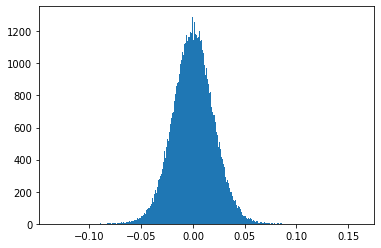

gm tensor(0.1605, device='cuda:0') tensor(-0.1335, device='cuda:0') tensor(0.0155, device='cuda:0')
xm-img: tensor(-0.6135, device='cuda:0')
gn tensor(0.0083, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(7.8201e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4583, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3671, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2757, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

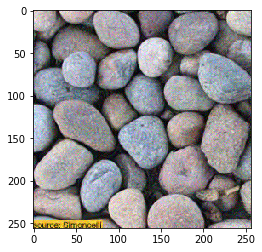

loss1 tensor(15.1347, device='cuda:0', grad_fn=<DivBackward0>)


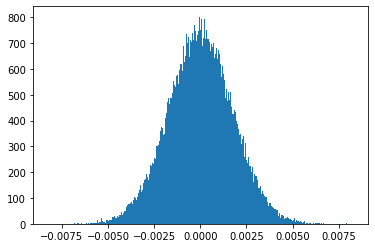

g1 tensor(0.0083, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(36.7692, device='cuda:0', grad_fn=<AddBackward0>)


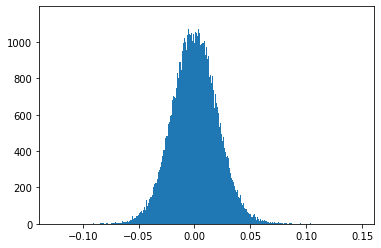

g2 tensor(0.1472, device='cuda:0') tensor(-0.1252, device='cuda:0') tensor(0.0162, device='cuda:0')


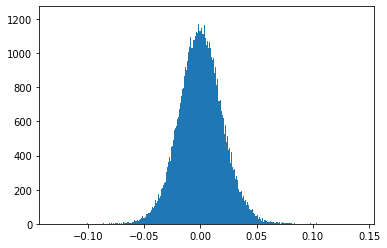

gm tensor(0.1410, device='cuda:0') tensor(-0.1296, device='cuda:0') tensor(0.0152, device='cuda:0')
xm-img: tensor(-0.6123, device='cuda:0')
gn tensor(0.0083, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(7.6294e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4583, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3671, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2757, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

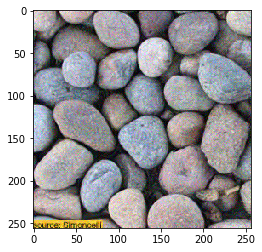

loss1 tensor(15.1346, device='cuda:0', grad_fn=<DivBackward0>)


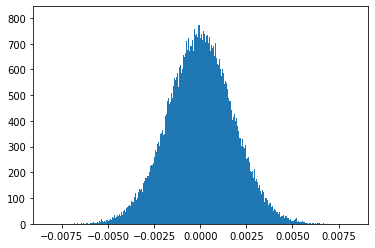

g1 tensor(0.0083, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(36.0611, device='cuda:0', grad_fn=<AddBackward0>)


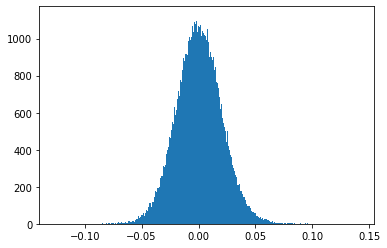

g2 tensor(0.1409, device='cuda:0') tensor(-0.1265, device='cuda:0') tensor(0.0159, device='cuda:0')


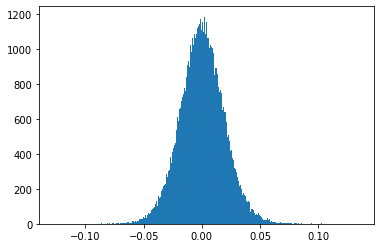

gm tensor(0.1350, device='cuda:0') tensor(-0.1264, device='cuda:0') tensor(0.0149, device='cuda:0')
xm-img: tensor(-0.6088, device='cuda:0')
gn tensor(0.0083, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(7.4387e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4583, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3671, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2758, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

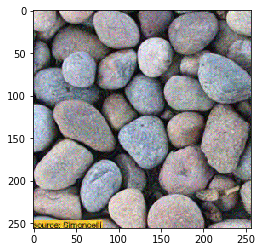

loss1 tensor(15.1346, device='cuda:0', grad_fn=<DivBackward0>)


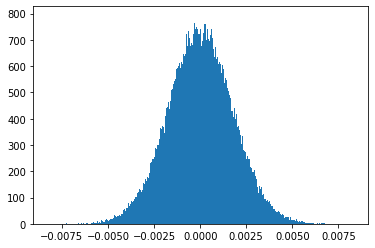

g1 tensor(0.0083, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(35.3782, device='cuda:0', grad_fn=<AddBackward0>)


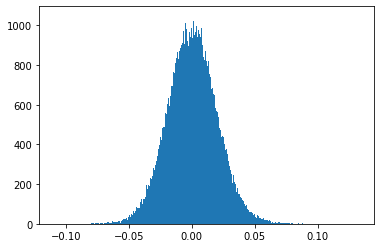

g2 tensor(0.1326, device='cuda:0') tensor(-0.1090, device='cuda:0') tensor(0.0156, device='cuda:0')


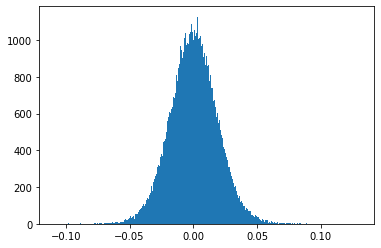

gm tensor(0.1299, device='cuda:0') tensor(-0.1089, device='cuda:0') tensor(0.0147, device='cuda:0')
xm-img: tensor(-0.6047, device='cuda:0')
gn tensor(0.0083, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(7.0572e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4583, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3671, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2758, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

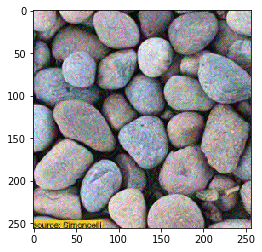

loss1 tensor(15.1345, device='cuda:0', grad_fn=<DivBackward0>)


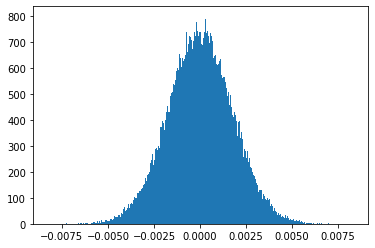

g1 tensor(0.0083, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(34.7204, device='cuda:0', grad_fn=<AddBackward0>)


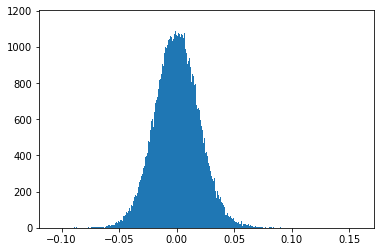

g2 tensor(0.1587, device='cuda:0') tensor(-0.1061, device='cuda:0') tensor(0.0153, device='cuda:0')


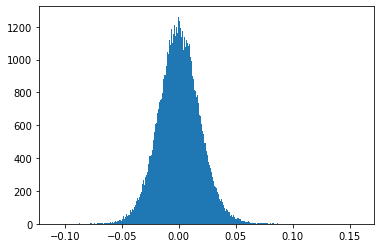

gm tensor(0.1579, device='cuda:0') tensor(-0.1088, device='cuda:0') tensor(0.0144, device='cuda:0')
xm-img: tensor(-0.6010, device='cuda:0')
gn tensor(0.0083, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(6.8665e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4583, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3671, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2758, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

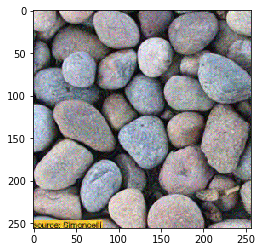

loss1 tensor(15.1345, device='cuda:0', grad_fn=<DivBackward0>)


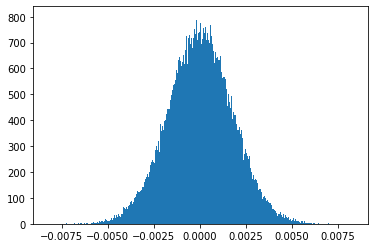

g1 tensor(0.0083, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(34.0862, device='cuda:0', grad_fn=<AddBackward0>)


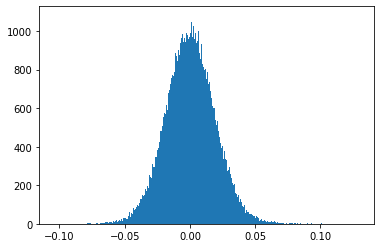

g2 tensor(0.1295, device='cuda:0') tensor(-0.1038, device='cuda:0') tensor(0.0150, device='cuda:0')


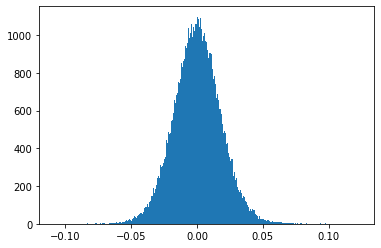

gm tensor(0.1230, device='cuda:0') tensor(-0.1082, device='cuda:0') tensor(0.0141, device='cuda:0')
xm-img: tensor(-0.5971, device='cuda:0')
gn tensor(0.0083, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(6.5804e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4583, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3671, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2758, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

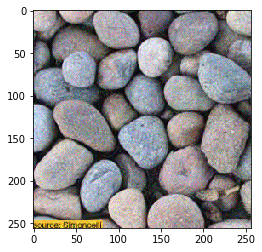

loss1 tensor(15.1345, device='cuda:0', grad_fn=<DivBackward0>)


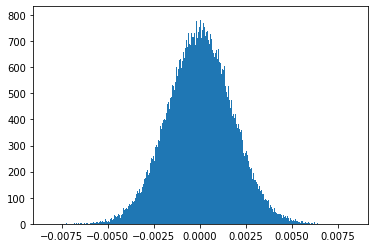

g1 tensor(0.0083, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(33.4736, device='cuda:0', grad_fn=<AddBackward0>)


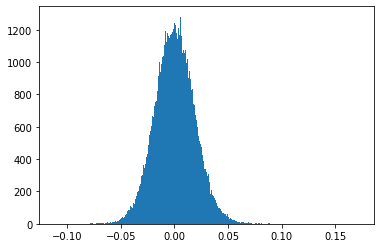

g2 tensor(0.1723, device='cuda:0') tensor(-0.1118, device='cuda:0') tensor(0.0148, device='cuda:0')


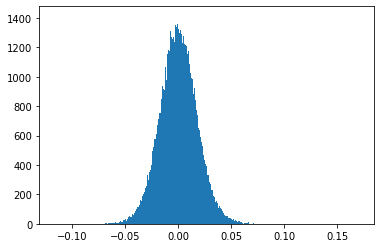

gm tensor(0.1704, device='cuda:0') tensor(-0.1162, device='cuda:0') tensor(0.0139, device='cuda:0')
xm-img: tensor(-0.5934, device='cuda:0')
gn tensor(0.0083, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(6.1989e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4583, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3672, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2758, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

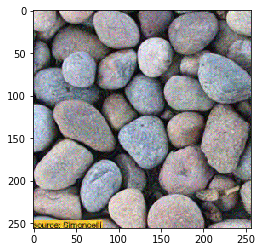

loss1 tensor(15.1346, device='cuda:0', grad_fn=<DivBackward0>)


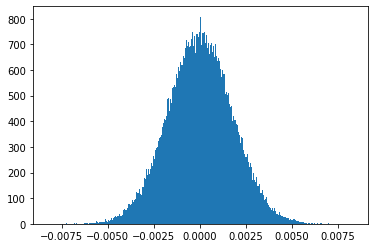

g1 tensor(0.0083, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(32.8822, device='cuda:0', grad_fn=<AddBackward0>)


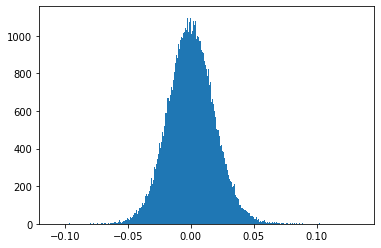

g2 tensor(0.1334, device='cuda:0') tensor(-0.1082, device='cuda:0') tensor(0.0145, device='cuda:0')


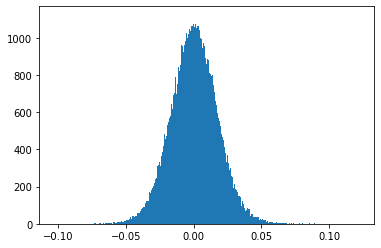

gm tensor(0.1221, device='cuda:0') tensor(-0.1029, device='cuda:0') tensor(0.0136, device='cuda:0')
xm-img: tensor(-0.5898, device='cuda:0')
gn tensor(0.0083, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(6.1035e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4583, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3672, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2758, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

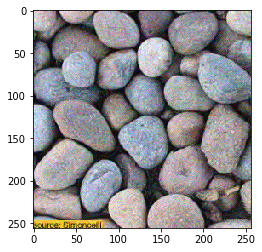

loss1 tensor(15.1346, device='cuda:0', grad_fn=<DivBackward0>)


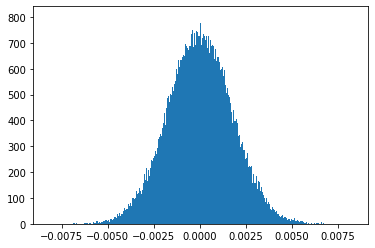

g1 tensor(0.0083, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(32.3101, device='cuda:0', grad_fn=<AddBackward0>)


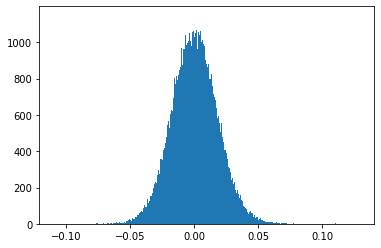

g2 tensor(0.1289, device='cuda:0') tensor(-0.1092, device='cuda:0') tensor(0.0143, device='cuda:0')


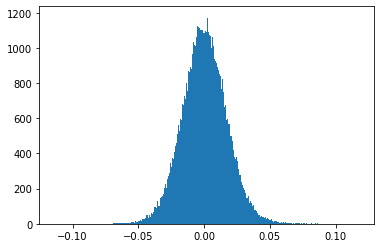

gm tensor(0.1178, device='cuda:0') tensor(-0.1136, device='cuda:0') tensor(0.0134, device='cuda:0')
xm-img: tensor(-0.5862, device='cuda:0')
gn tensor(0.0083, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(5.8174e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4583, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3672, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2758, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

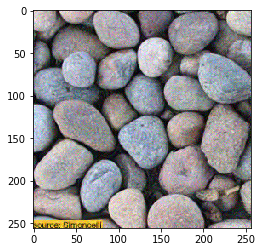

loss1 tensor(15.1346, device='cuda:0', grad_fn=<DivBackward0>)


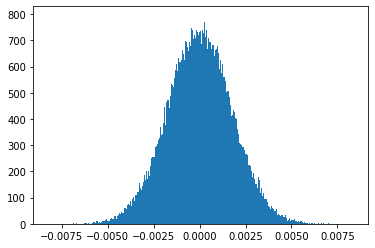

g1 tensor(0.0083, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(31.7572, device='cuda:0', grad_fn=<AddBackward0>)


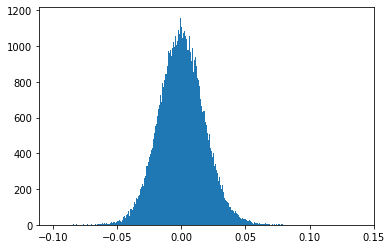

g2 tensor(0.1384, device='cuda:0') tensor(-0.0985, device='cuda:0') tensor(0.0140, device='cuda:0')


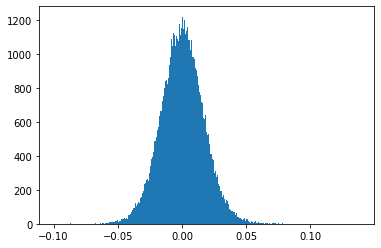

gm tensor(0.1379, device='cuda:0') tensor(-0.0991, device='cuda:0') tensor(0.0132, device='cuda:0')
xm-img: tensor(-0.5816, device='cuda:0')
gn tensor(0.0083, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(5.6267e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4583, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3672, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2758, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

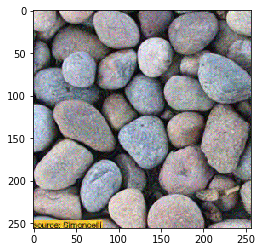

loss1 tensor(15.1346, device='cuda:0', grad_fn=<DivBackward0>)


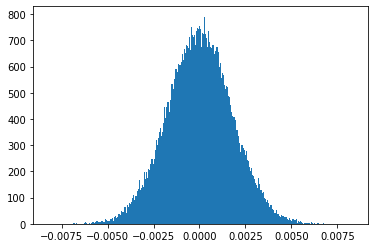

g1 tensor(0.0083, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(31.2211, device='cuda:0', grad_fn=<AddBackward0>)


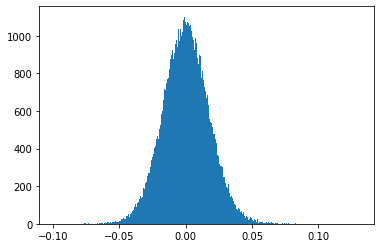

g2 tensor(0.1305, device='cuda:0') tensor(-0.0988, device='cuda:0') tensor(0.0138, device='cuda:0')


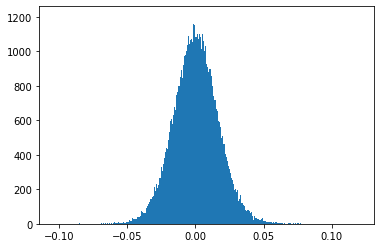

gm tensor(0.1199, device='cuda:0') tensor(-0.1031, device='cuda:0') tensor(0.0130, device='cuda:0')
xm-img: tensor(-0.5781, device='cuda:0')
gn tensor(0.0083, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(5.5313e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4583, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3672, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2758, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

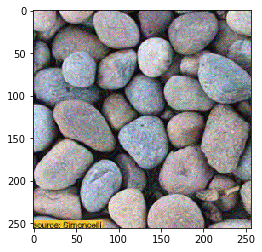

loss1 tensor(15.1346, device='cuda:0', grad_fn=<DivBackward0>)


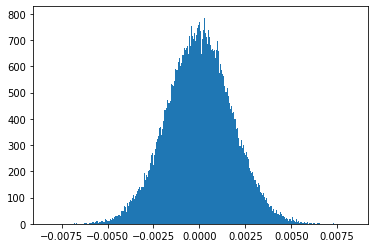

g1 tensor(0.0083, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(30.7026, device='cuda:0', grad_fn=<AddBackward0>)


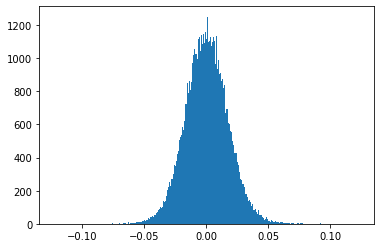

g2 tensor(0.1231, device='cuda:0') tensor(-0.1223, device='cuda:0') tensor(0.0136, device='cuda:0')


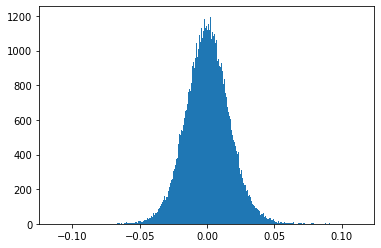

gm tensor(0.1128, device='cuda:0') tensor(-0.1132, device='cuda:0') tensor(0.0128, device='cuda:0')
xm-img: tensor(-0.5748, device='cuda:0')
gn tensor(0.0084, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(5.3406e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6396, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4583, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3672, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2758, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

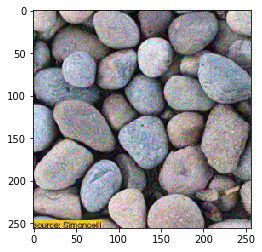

loss1 tensor(15.1346, device='cuda:0', grad_fn=<DivBackward0>)


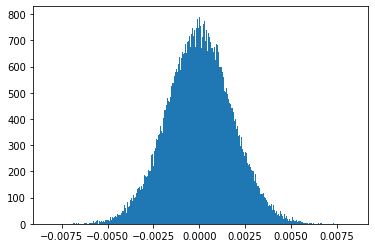

g1 tensor(0.0084, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(30.2001, device='cuda:0', grad_fn=<AddBackward0>)


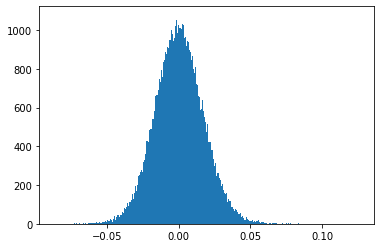

g2 tensor(0.1257, device='cuda:0') tensor(-0.0866, device='cuda:0') tensor(0.0134, device='cuda:0')


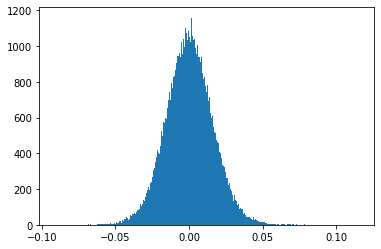

gm tensor(0.1156, device='cuda:0') tensor(-0.0913, device='cuda:0') tensor(0.0126, device='cuda:0')
xm-img: tensor(-0.5703, device='cuda:0')
gn tensor(0.0084, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(5.0545e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6397, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4583, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3672, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2758, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

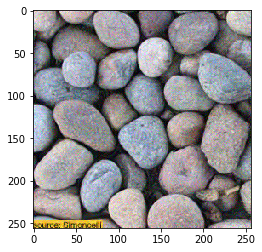

loss1 tensor(15.1346, device='cuda:0', grad_fn=<DivBackward0>)


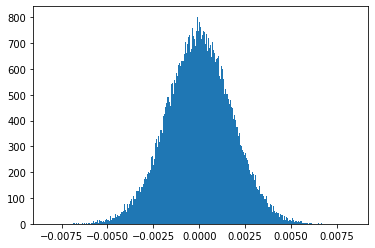

g1 tensor(0.0084, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(29.7118, device='cuda:0', grad_fn=<AddBackward0>)


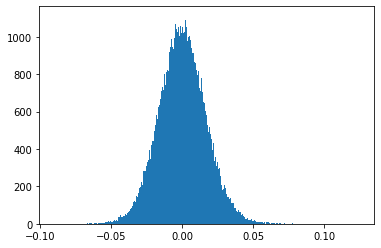

g2 tensor(0.1245, device='cuda:0') tensor(-0.0897, device='cuda:0') tensor(0.0132, device='cuda:0')


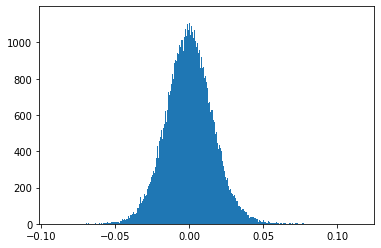

gm tensor(0.1147, device='cuda:0') tensor(-0.0907, device='cuda:0') tensor(0.0124, device='cuda:0')
xm-img: tensor(-0.5664, device='cuda:0')
gn tensor(0.0084, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(5.0545e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6397, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4583, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3672, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2758, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

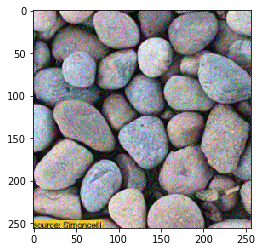

loss1 tensor(15.1346, device='cuda:0', grad_fn=<DivBackward0>)


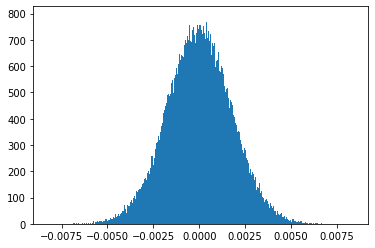

g1 tensor(0.0084, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(29.2392, device='cuda:0', grad_fn=<AddBackward0>)


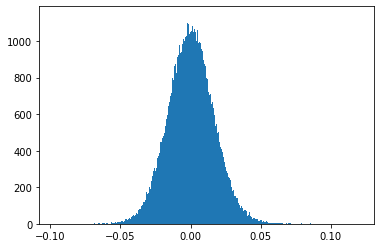

g2 tensor(0.1201, device='cuda:0') tensor(-0.0971, device='cuda:0') tensor(0.0130, device='cuda:0')


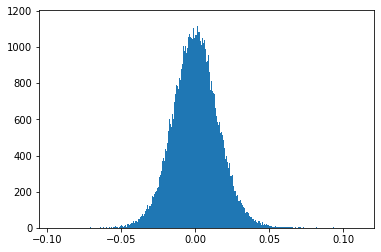

gm tensor(0.1107, device='cuda:0') tensor(-0.0948, device='cuda:0') tensor(0.0122, device='cuda:0')
xm-img: tensor(-0.5629, device='cuda:0')
gn tensor(0.0084, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(4.9591e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6397, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4583, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3672, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2758, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

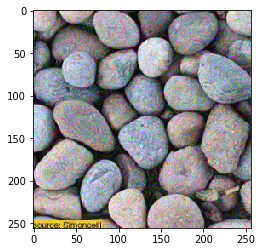

loss1 tensor(15.1346, device='cuda:0', grad_fn=<DivBackward0>)


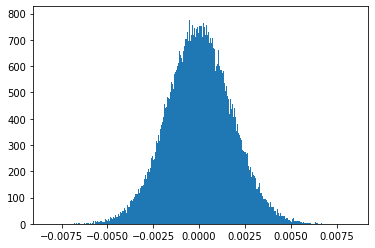

g1 tensor(0.0084, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(28.7801, device='cuda:0', grad_fn=<AddBackward0>)


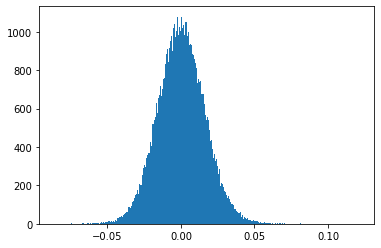

g2 tensor(0.1210, device='cuda:0') tensor(-0.0860, device='cuda:0') tensor(0.0128, device='cuda:0')


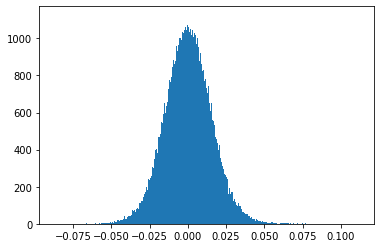

gm tensor(0.1117, device='cuda:0') tensor(-0.0870, device='cuda:0') tensor(0.0120, device='cuda:0')
xm-img: tensor(-0.5591, device='cuda:0')
gn tensor(0.0084, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(4.6730e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6397, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4583, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3672, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2758, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

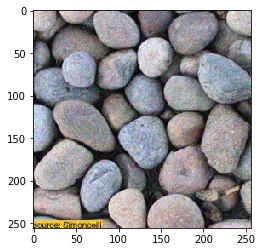

loss1 tensor(15.1346, device='cuda:0', grad_fn=<DivBackward0>)


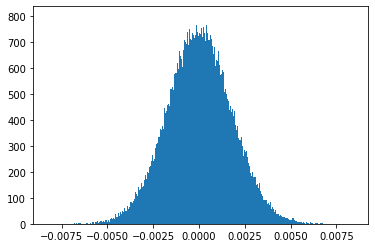

g1 tensor(0.0084, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(28.3342, device='cuda:0', grad_fn=<AddBackward0>)


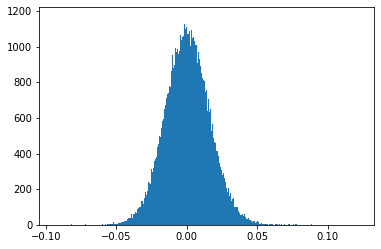

g2 tensor(0.1222, device='cuda:0') tensor(-0.0938, device='cuda:0') tensor(0.0126, device='cuda:0')


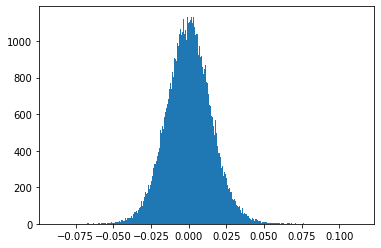

gm tensor(0.1130, device='cuda:0') tensor(-0.0890, device='cuda:0') tensor(0.0118, device='cuda:0')
xm-img: tensor(-0.5550, device='cuda:0')
gn tensor(0.0084, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(4.6730e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6397, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4583, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3672, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2758, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

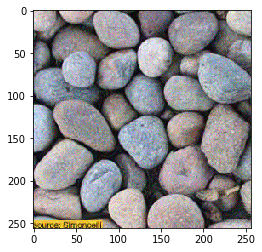

loss1 tensor(15.1346, device='cuda:0', grad_fn=<DivBackward0>)


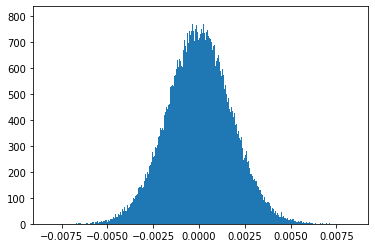

g1 tensor(0.0084, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(27.9013, device='cuda:0', grad_fn=<AddBackward0>)


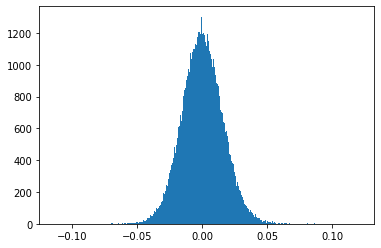

g2 tensor(0.1206, device='cuda:0') tensor(-0.1132, device='cuda:0') tensor(0.0124, device='cuda:0')


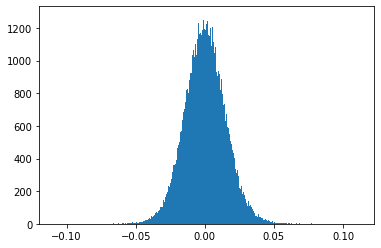

gm tensor(0.1116, device='cuda:0') tensor(-0.1086, device='cuda:0') tensor(0.0117, device='cuda:0')
xm-img: tensor(-0.5512, device='cuda:0')
gn tensor(0.0084, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(4.5776e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6397, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4583, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3672, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2758, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

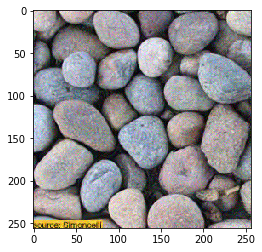

loss1 tensor(15.1346, device='cuda:0', grad_fn=<DivBackward0>)


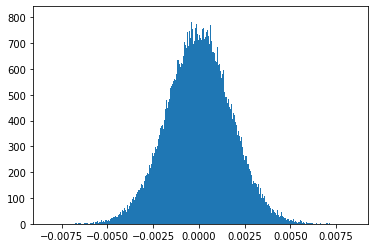

g1 tensor(0.0084, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(27.4797, device='cuda:0', grad_fn=<AddBackward0>)


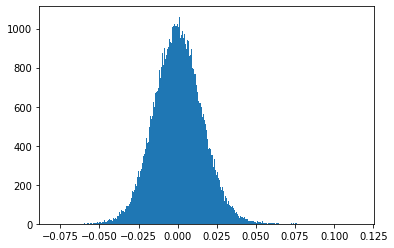

g2 tensor(0.1158, device='cuda:0') tensor(-0.0787, device='cuda:0') tensor(0.0122, device='cuda:0')


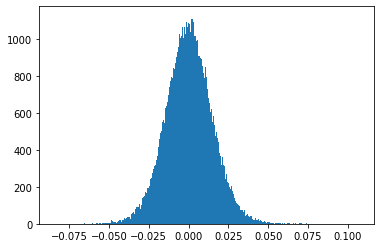

gm tensor(0.1071, device='cuda:0') tensor(-0.0842, device='cuda:0') tensor(0.0115, device='cuda:0')
xm-img: tensor(-0.5474, device='cuda:0')
gn tensor(0.0084, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(4.2915e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6397, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4583, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3672, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2758, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

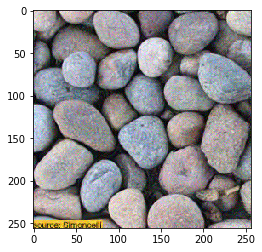

loss1 tensor(15.1346, device='cuda:0', grad_fn=<DivBackward0>)


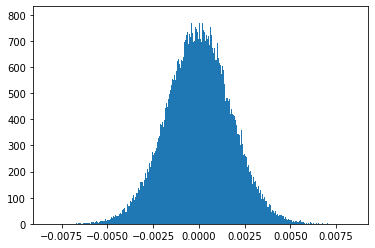

g1 tensor(0.0084, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(27.0691, device='cuda:0', grad_fn=<AddBackward0>)


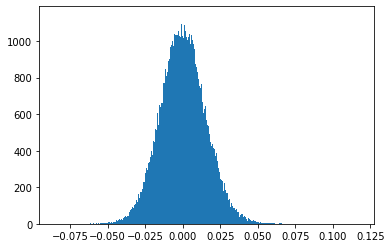

g2 tensor(0.1174, device='cuda:0') tensor(-0.0853, device='cuda:0') tensor(0.0121, device='cuda:0')


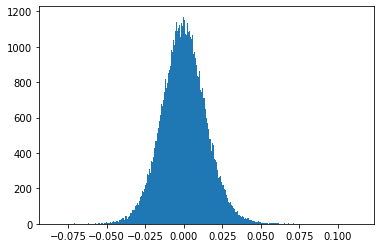

gm tensor(0.1138, device='cuda:0') tensor(-0.0837, device='cuda:0') tensor(0.0114, device='cuda:0')
xm-img: tensor(-0.5436, device='cuda:0')
gn tensor(0.0084, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(4.1962e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6397, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4583, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3672, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2758, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

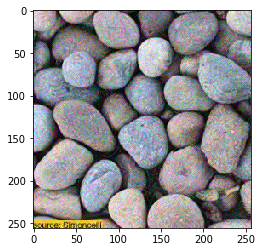

loss1 tensor(15.1346, device='cuda:0', grad_fn=<DivBackward0>)


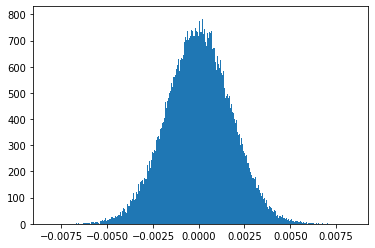

g1 tensor(0.0084, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(26.6698, device='cuda:0', grad_fn=<AddBackward0>)


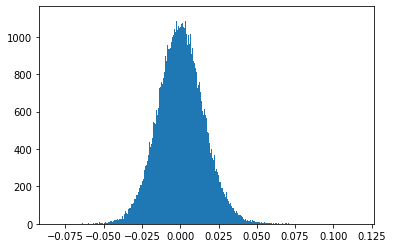

g2 tensor(0.1166, device='cuda:0') tensor(-0.0821, device='cuda:0') tensor(0.0119, device='cuda:0')


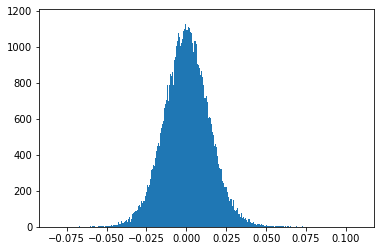

gm tensor(0.1082, device='cuda:0') tensor(-0.0825, device='cuda:0') tensor(0.0112, device='cuda:0')
xm-img: tensor(-0.5394, device='cuda:0')
gn tensor(0.0084, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(4.1962e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6397, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.899969998499925 tensor(0.5491, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.7499624981249062 tensor(0.4583, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.5999549977498875 tensor(0.3672, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.4499474973748687 tensor(0.2758, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -0.

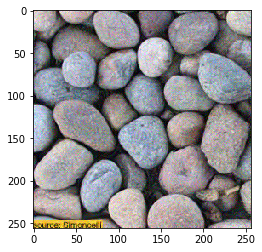

loss1 tensor(15.1346, device='cuda:0', grad_fn=<DivBackward0>)


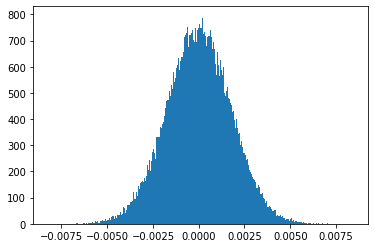

g1 tensor(0.0084, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')




loss2 tensor(26.2808, device='cuda:0', grad_fn=<AddBackward0>)


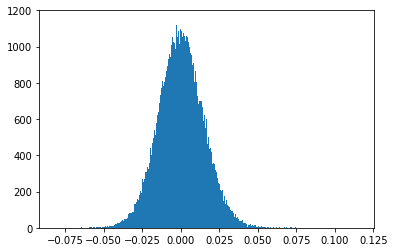

g2 tensor(0.1157, device='cuda:0') tensor(-0.0817, device='cuda:0') tensor(0.0118, device='cuda:0')


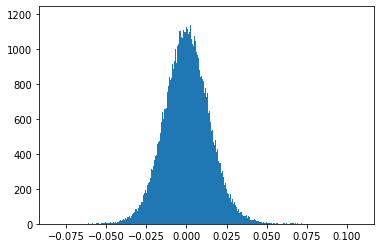

gm tensor(0.1075, device='cuda:0') tensor(-0.0821, device='cuda:0') tensor(0.0111, device='cuda:0')
xm-img: tensor(-0.5349, device='cuda:0')
gn tensor(0.0084, device='cuda:0') tensor(-0.0082, device='cuda:0') tensor(0.0014, device='cuda:0')
comp tensor(4.1008e-05, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.5 tensor(0.9096, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.3499924996249812 tensor(0.8199, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.1999849992499625 tensor(0.7299, device='cuda:0', grad_fn=<AbsBackward>)
v temp_comp -1.0499774988749437 tensor(0.6397, device='cuda:0', grad_fn=<AbsBackward>)


In [ ]:
model_style, style_losses = get_style_model_and_losses(cnn,
          cnn_normalization_mean, cnn_normalization_std, ref_img)



imgn.data.clamp_(0,1)
input_img = imgn.detach()
ref = ref_img.detach()
cu = 0

iterations = 1000

for i in range(iterations):
    
    #loss1, g1 = model_gram(model_style, input_img.detach(), style_losses)
    loss1, g1 = mse(input_img.detach(), ref.detach())
    
    print('loss1',loss1)
    plt.hist(g1.cpu(),1000)
    plt.show()
    print('g1',g1.max(),g1.min(),torch.mean(torch.abs(g1)))
    
    #loss2, g2 = mse(input_img.detach(), ref.detach())
    loss2, g2 = model_gram(model_style, input_img.detach(), style_losses)
    
    print('\n\n\n')
    
    print('loss2',loss2)
    plt.hist(g2.cpu(),1000)
    plt.show()
    print('g2',g2.max(),g2.min(),torch.mean(torch.abs(g2)))
    
    y, comp = search_grad(ref.detach(), g = g2, gkeep = g1, img = input_img.detach(), mkeep = mse, lamda = 0.01)
    
    cu = cu + comp
    print('cumulate comp:', cu)
    if comp > 1:
        torch.save(y,'temp.pt')  
        break
        
    plt.figure()
    imshow(torch.clamp(y,0,1))
        
    input_img = y
    

In [130]:
torch.save(input_img, 'pebbles_noise_1.pt')

In [95]:
#im = torch.load( 'pebbles_blur6.5_5.pt')

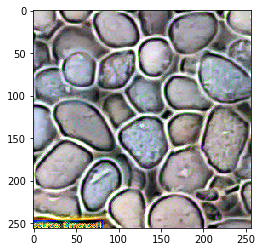

In [96]:
plt.figure()
#imshow(input_img)
#imshow(im)